### <h1 style="background-color:#1a3afe;color:#efff7e;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre> Extension: Shift Invariance Can Reduce Adversarial Robustness </centre></strong></h1>

### <h2 style="background-color:#56cbf9;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Recap from the reproduction phase </centre></strong></h2>

From the reproduction experiments, we observed the following trends for both Mnist and Fashion Mnist datasets:

**Mnist Dataset:**
- When considering the consistency score in relation to invariance, a hypothetical order of robustness emerged, suggesting that models with higher consistency scores should exhibit lower invariance, this was the hypothesis defended by the paper. The order, from the most robust to the least robust, is as follows: **simple_FC_1024**, **simple_FC_256**, **simple_Conv_10_512**, simple_Conv_2, **simple_Conv_12_2048**, simple_Conv_NL, and simple_Conv_max.
- However, the actual order of robustness, especially for norm=∞ and epsilon=2, deviates slightly from the hypothetical order. The observed order, from the most to least robust, is: simple_Conv_2, **simple_FC_1024**, **simple_FC_256**, simple_Conv_max, **simple_Conv_10_512**, **simple_Conv_12_2048**, and simple_Conv_NL. Nonetheless, the models used in the paper follow the hypothetical order quite closely.
- Interestingly, the models simple_Conv_max and simple_Conv_2 exhibit some unexpected results, which deviate from the expected robustness order.
- The accuracy on the attack data for Mnist, considering different norms, is visualized in two plots:
- ![mnist_inf](plots/mnist_inf.png)

- ![mnist_norm2](plots/mnist_norm2.png).

**Fashion Mnist Dataset:**
- Similar to the Mnist dataset, for Fashion Mnist, the consistency score's hypothetical order of robustness, where higher consistency scores correspond to lower invariance, is as follows: simple_FC_2, simple_Conv_2, **simple_FC_2_256**, **simple_FC_3_512**, simple__RNN, simple_Conv_max, **simple_Conv_10_512**, **simple_Conv_12_2048**, and simple_Conv_NL.
- The actual order of robustness, particularly for norm=∞ and epsilon=3, does not perfectly align with the hypothetical order. The observed order, from the most robust to the least robust, is: simple_Conv_2, simple_FC_2, **simple_FC_2_256**, **simple_FC_3_512**, **simple_Conv_12_2048**, simple__RNN, **simple_Conv_10_512**, simple_Conv_NL, and simple_Conv_max.
- Similarly to the Mnist dataset, simple_Conv_2 exhibits some unexpected results in the Fashion Mnist dataset.
- The accuracy on the attack data for Fashion Mnist, considering different norms, is depicted in two plots:
- ![fashion_inf](plots/fashion_inf.png)

- ![fashion_norm2](plots/fashion_norm2.png).

Overall, the observed results demonstrate some deviations from the expected order of robustness, and specific models, such as simple_Conv_max and simple_Conv_2, display unexpected behaviors in both datasets. Nonetheless, the majority of the models follow the anticipated trend, indicating that consistency scores are generally inversely related to invariance, as initially hypothesized.

We also saw transferability:

<div>
<img src="plots/Transfer.png" width="1000"/>
</div>

Maxpooling seems to give the model robustness when it comes to transferability.

### <h2 style="background-color:#56cbf9;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre> MNIST </centre></strong></h2>

The experiment focuses on exploring robustness parameters. To this end, we use a similar experimental setting as the paper. Using the MNIST dataset and later Fashion MNIST, We try two pooling types (max and average) and the different number of layers. Moreover, we compare two kernel sizes 10 (the one used in the paper) and 3 (the commonly used). We also compare the impact of adding a dense layer before the output layer. The models will be named $simple\_Conv\_{X}\_{A}\_{Y}\_{B}$ , X:n\_layers, Y:kernel\_size, A: (True for max\_pooling False for average\_pooling) and add\_dense: (True for dense layer added, False for not added).

Experimental settings: All the models were trained for 20 epochs using ADAM optimizer, a batch size of 200, and a learning rate of 0.01 decreased by a factor of 10 at the $10^{th}$ and $15^{th}$  epochs. Robustness evaluation involved the PGD $l_2$ and $l_\infty$ attacks with varied epsilon values, and instead of limiting the iterations to 10 we use a larger iteration limit of 100.

The script used is `scripts/pooling_and_layers_scale.py`, and completed with `scripts/pooling_and_layers_scale_2.py`.  We used the [LRZ AI Systems](https://doku.lrz.de/lrz-ai-systems-11484278.html) to run the scripts.

In [1]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, ReLU, GlobalAveragePooling2D, Dense, Lambda, Flatten, GlobalMaxPooling2D, MaxPooling2D, AveragePooling2D
from art.estimators.classification import TensorFlowV2Classifier
from art.attacks.evasion import FastGradientMethod, ProjectedGradientDescentTensorFlowV2
from tqdm import tqdm
import os
from art.utils import load_mnist
from tests.utils import master_seed
from art.estimators.classification import TensorFlowV2Classifier
import pickle

In [60]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Load Accuracy data
from functions.extension_models import simple_FC, circular_padding, simple_Conv
with open('data/mnist_extension/mnist_accuracy_data.pkl', 'rb') as file:
    accuracy_data = pickle.load(file)
with open('data/mnist_extension/mnist_model_names.pkl', 'rb') as file:
    model_names = pickle.load(file)
with open('data/mnist_extension/mnist_acc_array.pkl', 'rb') as file:
    acc_array = pickle.load(file)
with open('data/mnist_extension/mnist_loss_array.pkl', 'rb') as file:
    loss_array = pickle.load(file)


In [4]:
#load models
models = []
model_names_ = list(model_names.keys())
# [classifier, test_acc, train_acc, test_loss, train_loss]
for i, model_name in enumerate(model_names_):
    model_file = f'models/extension/{model_name}.h5' # TODO
    model = tf.keras.models.load_model(model_file,  compile=False )
    accuracy_test= acc_array[i][0]
    accuracy_train= acc_array[i][1]
    loss_test = loss_array[i][0]
    loss_train = loss_array[i][0]
    models.append((model, accuracy_test,accuracy_train, loss_test,loss_train))

In [5]:
import plotly.graph_objects as go
import plotly.io as pio
# Training plot
fig_traces = []
for model_name, (_,_,_,test_loss,train_loss) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_loss)), y=train_loss, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_loss)), y=test_loss, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Loss'),
    title='Training and Validation Loss',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)

In [6]:
fig_traces = []
for model_name, (_, test_acc, train_acc,_,_) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_acc)), y=train_acc, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_acc)), y=test_acc, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Accuracy'),
    title='Training and Validation Accuracy',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)

We can see that some models did not train, which is expected because some combinations are not valid, we will just omit the untrained models later.

### <h3 style="background-color:#56cbf9;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Results </centre></strong></h3>

In [7]:
attack_params = [[np.inf, [0.05, 0.1,  0.15, 0.2,0.25]],[2, [0.5, 1,  1.5, 3]]]
import matplotlib.pyplot as plt
norms = [attack_params[0][0], attack_params[1][0]]
epsilons = {
    attack_params[0][0]: attack_params[0][1],
    attack_params[1][0]: attack_params[1][1]
}

Let's plot the robustness for all the models.

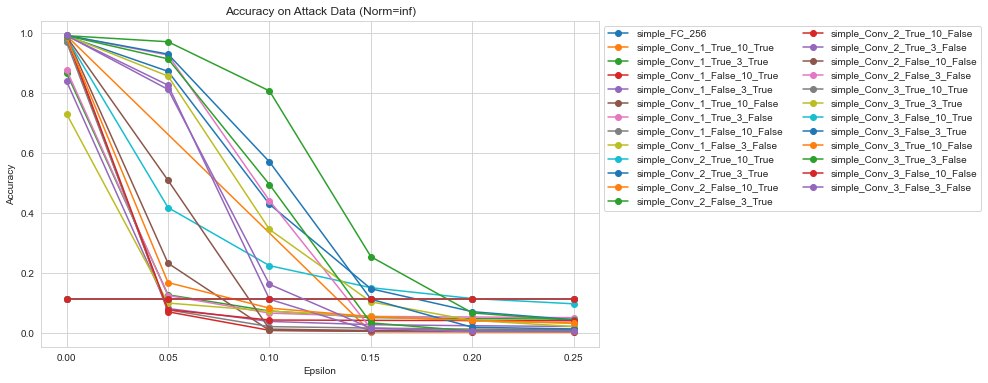

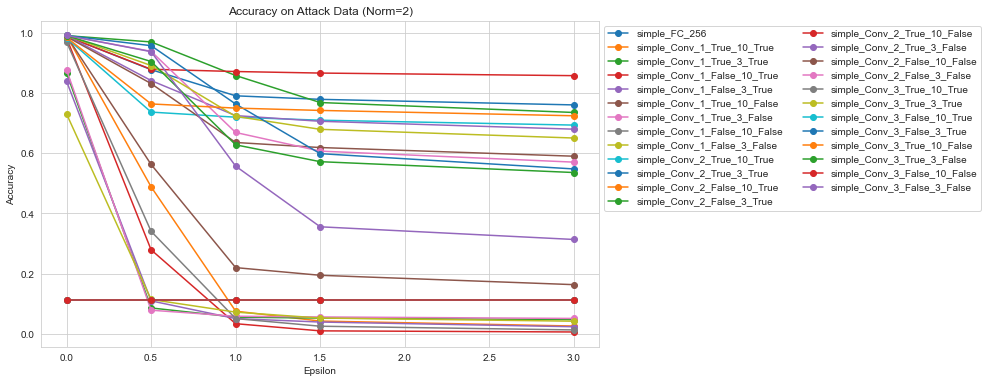

In [8]:
for norm in norms:
    plt.figure(figsize=(10, 6))  # Increase the figure size for better spacing

    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        plt.plot(eps, accs, marker='o', label=model_name)

    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    plt.title(f"Accuracy on Attack Data (Norm={norm})")

    # Place the legend outside the plot area to avoid overlapping
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=2)

    plt.show()


In [9]:
import plotly.graph_objects as go
for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        if accuracies == None:
            print(model_name,accuracies)
        eps, accs = zip(*accuracies)
        # Set the line style based on the model name
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
        fig.add_trace(go.Scatter(x=eps, y=accs, mode='lines+markers', name=model_name, line=dict(dash=line_dash)))
    fig.update_layout(
        xaxis_title='Epsilon',
        yaxis_title='Accuracy',
        title=f'Accuracy on Attack Data (Norm={norm})',
        showlegend=True
    )
    fig.show()

Some data points are missing, we can fill them using the saved data.

In [10]:
# check which model is missing data
import plotly.graph_objects as go
for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        if len(accuracies)<4:
            print(model_name,accuracies)

simple_FC_256 [(0, 0.9799)]
simple_FC_256 [(0, 0.9799)]


In [11]:
master_seed(420)
(x_train, y_train), (x_test, y_test), min_pixel_value, max_pixel_value = load_mnist()
simple_FC_model = models[0]
classifier = simple_FC_model[0]
model_name = "simple_FC_256"
# Iterate over the attack parameters and generate adversarial examples
for norm, epsilons in attack_params:
    # Calculate accuracy on normal data (epsilon = 0)
    predictions = classifier.predict(x_test, verbose=0)
    accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1)) / len(y_test)
    accuracy_data[norm][model_name].append((0, accuracy))
    for epsilon in epsilons:
        try:
            file_path = f"data/mnist_extension/2_simple_FC_256_ProjectedGradientDescentTensorFlowV2_{epsilon}_test.npz"
            #file_path = f"scripts/extension_pooling_layers/2_simple_FC_256_ProjectedGradientDescentTensorFlowV2_{epsilon}_test.npz"
            data = np.load(file_path)
        except:
            print(file_path, " not found")
            continue
        x_test_attack = data['x_test_attack']
        y_test_attack = data['y_test_attack']

        # Calculate accuracy on adversarial data (epsilon > 0)
        predictions = classifier.predict(x_test_attack, verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test_attack, axis=1)) / len(y_test_attack)
        accuracy_data[norm][model_name].append((epsilon, accuracy))

In [12]:
import plotly.graph_objects as go
for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        if len(accuracies)<4:
            print(model_name,accuracies)

### Removing untrained models

Skip this part if you want to have all the models in the plot:

In [13]:
# uncomment the commented parts to see the process, we will remove the models with an accuracy smaller than 0.2
model_acc = [(model_name, test_acc[-1]) for model_name, (_, test_acc, train_acc,_,_) in zip(model_names.keys(), models)]
#print(min([accuracy for (model_name, accuracy) in model_acc]))
#print(max([accuracy for (model_name, accuracy) in model_acc]))
# Lets consider a limit of 0.2 (it is actually higher than that but the untrained models accuracy stays around 0.1, random)
models_to_remove = [model_name for (model_name, accuracy) in model_acc if accuracy<0.2]
print("models to remove", models_to_remove)
model_acc = [item for item in model_acc if item[0] not in models_to_remove]
#print(min([accuracy for (model_name, accuracy) in model_acc]))

models to remove ['simple_Conv_2_False_10_True', 'simple_Conv_3_True_10_True', 'simple_Conv_3_False_10_True', 'simple_Conv_3_False_10_False']


In [14]:
models_to_remove_temp = []
# Iterate over the dictionary to identify models to remove
for norm, norm_data in accuracy_data.items():
    for model_name in norm_data:
        if model_name in models_to_remove:
            #print(norm, model_name)
            models_to_remove_temp.append((norm, model_name))
for norm, model_name in models_to_remove_temp:
    del accuracy_data[norm][model_name]

index_ = 0
indices_to_remove = []
for model_name, function in model_names.items():
    if  model_name in models_to_remove:
        #print(model_name)
        indices_to_remove.append(index_)
    index_+=1

for model_name in models_to_remove:
    del model_names[model_name]
#print(indices_to_remove)
models  = [models.pop(index) for index in sorted(indices_to_remove, reverse=True)]

In [15]:
%xdel model_acc
%xdel indices_to_remove
%xdel models_to_remove_temp
%xdel index_
%xdel models_to_remove
import gc
gc.collect()

12881

In [16]:
# For later plots, we can either give the colors ourselves or automate it with color palettes
# we setting up the colours by hand, but you can use the seaborn palettes:
import seaborn as sns
sns.color_palette("husl", n_colors=5).as_hex()

['#f77189', '#ae9d31', '#33b07a', '#38a9c5', '#cc7af4']

### By number of layers

In [17]:
from functions.Extension_utils import plot_by_param, plot_by_param_sns
# use plot_by_param for a plotly graph - use plot_by_param_sns for matplotlib/seaborn

In [18]:
layers_colors = {
    1: 'rgb(31, 119, 180)',    # Blue
    2: 'rgb(255, 127, 14)',    # Orange
    3: 'rgb(44, 160, 44)',     # Green
}
param_ = "nlayers"
plot_by_param(norms,model_names,accuracy_data,layers_colors,param_,filter_by_layers=False, n_layer=1)

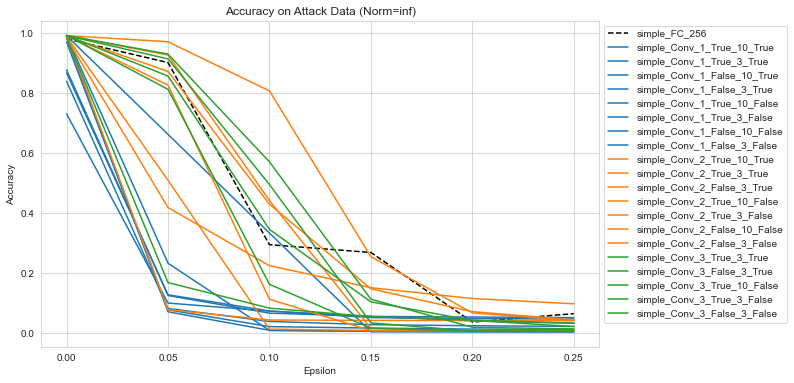

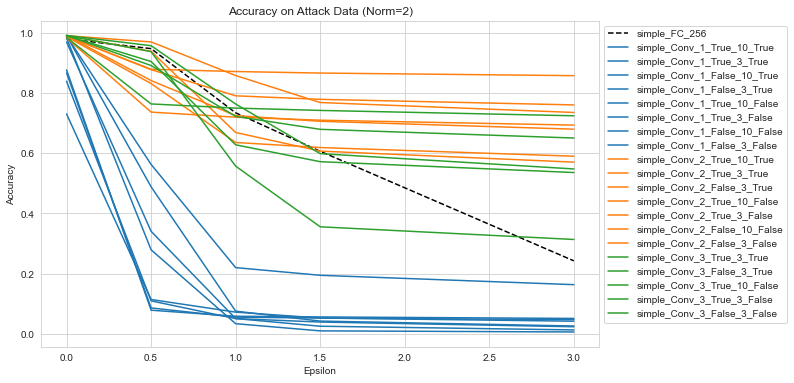

In [19]:
layers_colors = {
    1: (31/255, 119/255, 180/255),    # Blue
    2: (255/255, 127/255, 14/255),    # Orange
    3: (44/255, 160/255, 44/255),     # Green
}
param_ = "nlayers"
plot_by_param_sns(norms,model_names,accuracy_data,layers_colors,param_,filter_by_layers=False)

### By Pooling

In [20]:
pooling_colors = {
    True: 'rgb(31, 119, 180)',   # Blue
    False: 'rgb(255, 127, 14)',  # Orange
}
param_ = "pooling"
plot_by_param(norms,model_names,accuracy_data,pooling_colors,param_,filter_by_layers=False, n_layer=1)

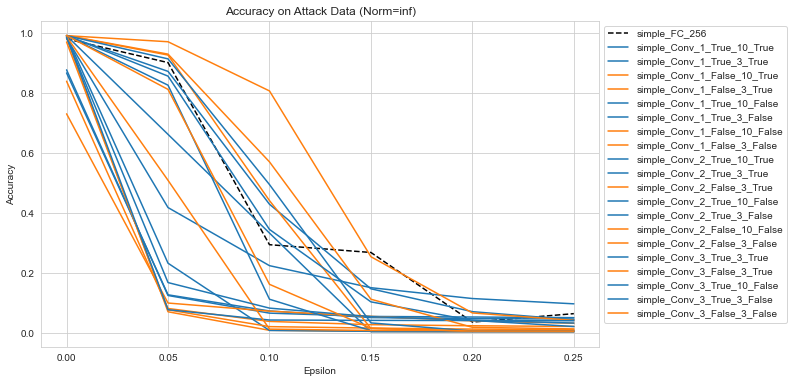

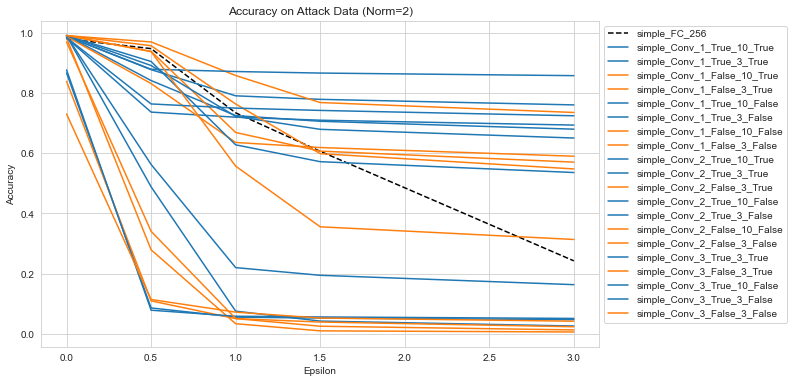

In [21]:
pooling_colors = {
    True: (31/255, 119/255, 180/255),   # Blue
    False: (255/255, 127/255, 14/255),  # Orange
}
param_ = "pooling"
plot_by_param_sns(norms,model_names,accuracy_data,pooling_colors,param_,filter_by_layers=False, n_layer=1)

#### By Pooling - Number of layers

In [22]:
pooling_colors = {
    True: 'rgb(31, 119, 180)',   # Blue
    False: 'rgb(255, 127, 14)',  # Orange
}
param_ = "pooling"
plot_by_param(norms,model_names,accuracy_data,pooling_colors,param_,filter_by_layers=True, n_layer=1)

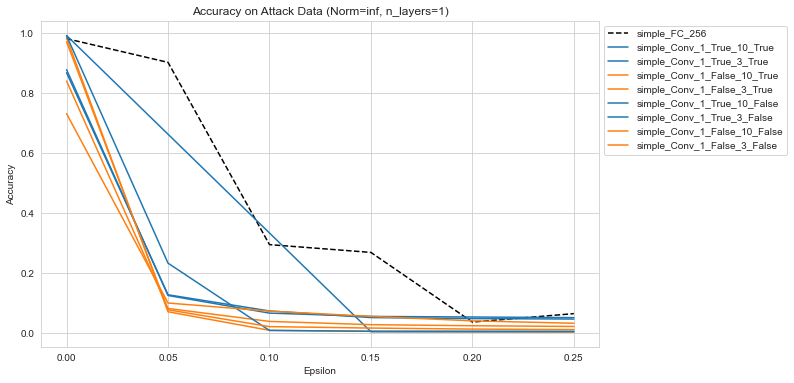

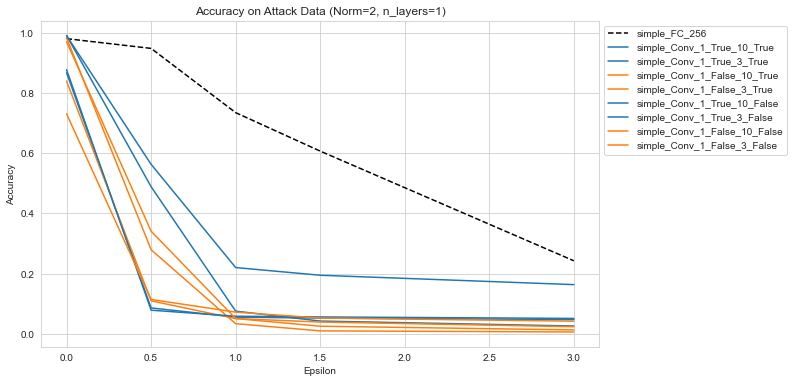

In [23]:
pooling_colors = {
    True: (31/255, 119/255, 180/255),   # Blue
    False: (255/255, 127/255, 14/255),  # Orange
}
param_ = "pooling"
plot_by_param_sns(norms,model_names,accuracy_data,pooling_colors,param_,filter_by_layers=True, n_layer=1)

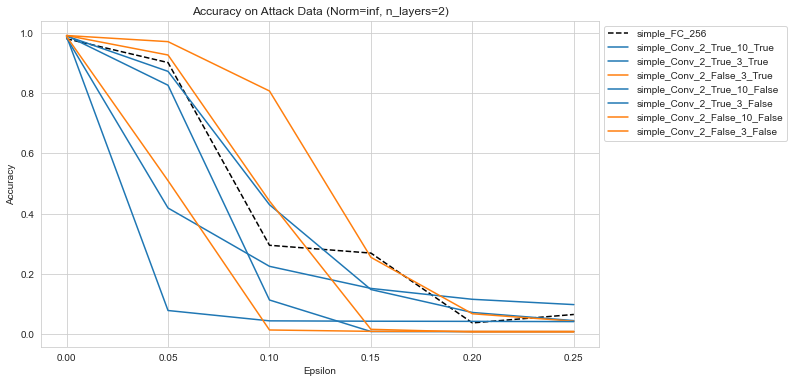

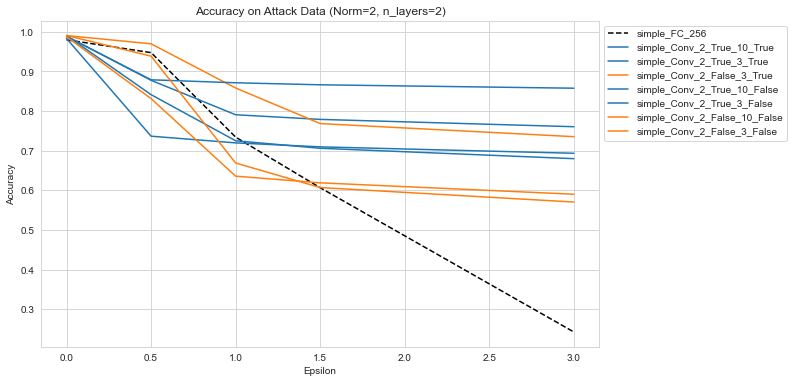

In [24]:
plot_by_param_sns(norms,model_names,accuracy_data,pooling_colors,param_,filter_by_layers=True, n_layer=2)

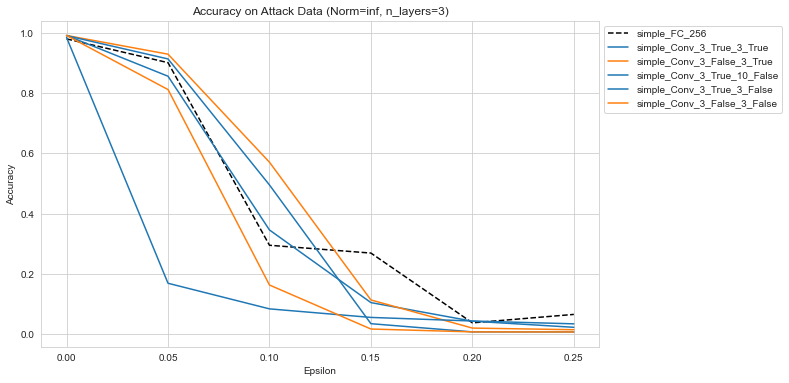

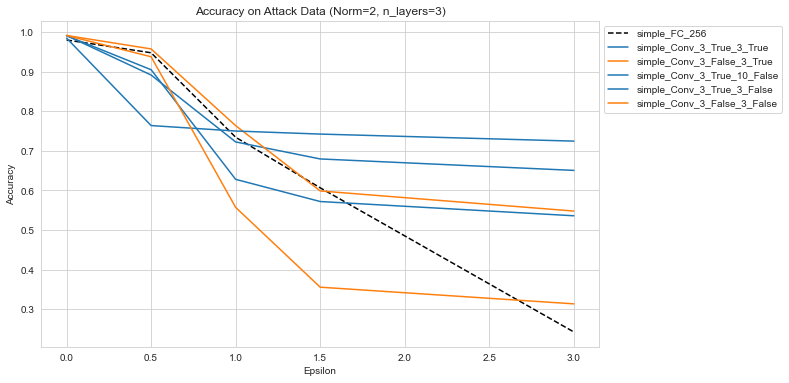

In [25]:
plot_by_param_sns(norms,model_names,accuracy_data,pooling_colors,param_,filter_by_layers=True, n_layer=3)

### By kernel size

In [26]:
kernel_colors = {
    10: 'rgb(31, 119, 180)',    # Blue
    3: 'rgb(255, 127, 14)',     # Orange
}
param_ ="kernels"
plot_by_param(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=False, n_layer=1)

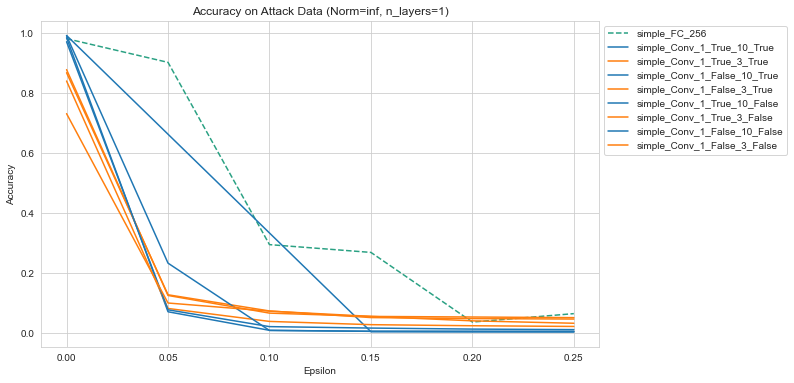

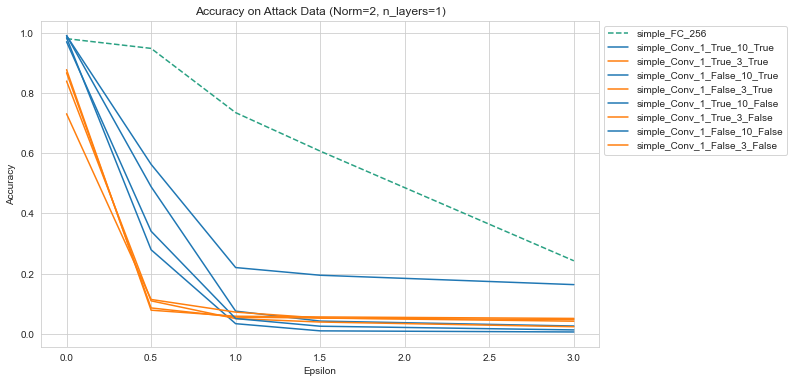

In [27]:
kernel_colors = {
    10: (31/255, 119/255, 180/255),    # Blue
    3: (255/255, 127/255, 14/255),     # Orange
}
plot_by_param_sns(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=True, n_layer=1)

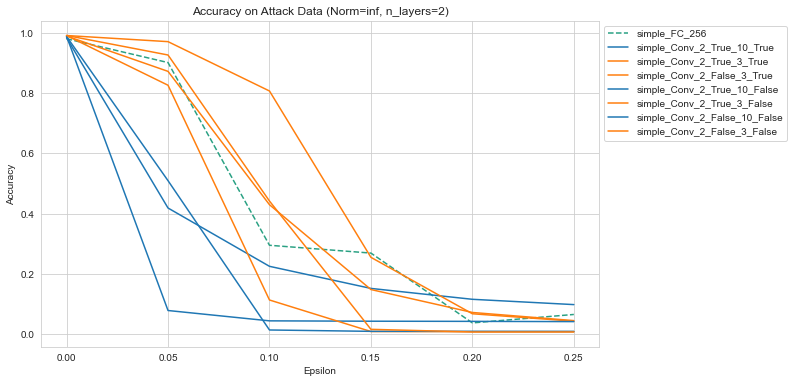

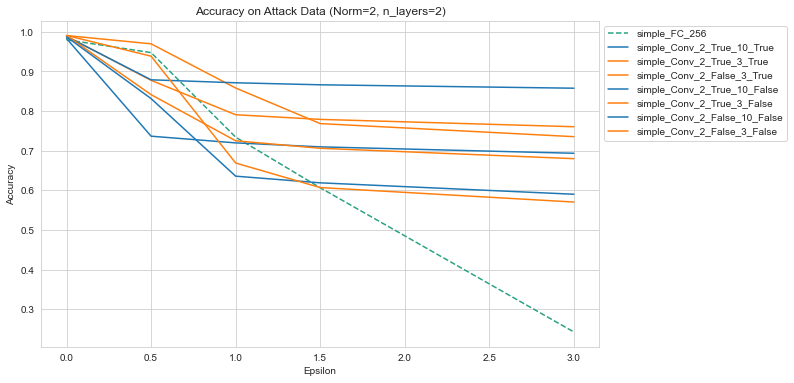

In [28]:
plot_by_param_sns(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=True, n_layer=2)

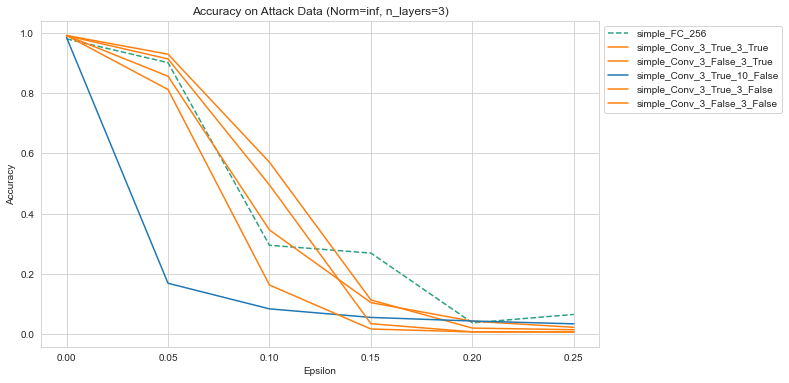

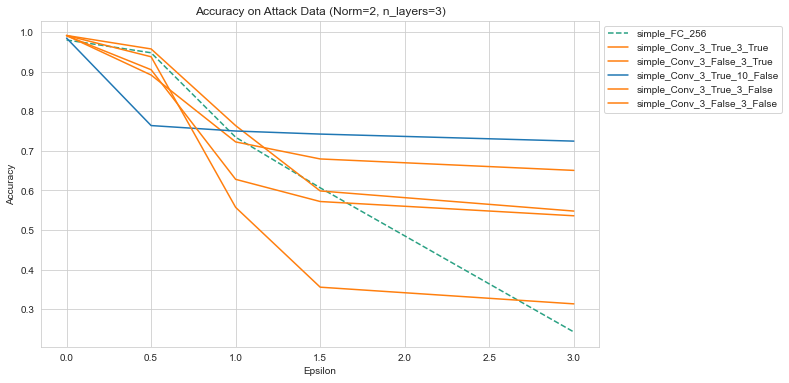

In [29]:
plot_by_param_sns(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=True, n_layer=3)

### By Dense layer

In [30]:
dense_colors = {
    True: 'rgb(31, 119, 180)',   # Blue
    False: 'rgb(255, 127, 14)',  # Orange
}
param_ ="dense"
plot_by_param(norms,model_names,accuracy_data,dense_colors,param_,filter_by_layers=False, n_layer=1)

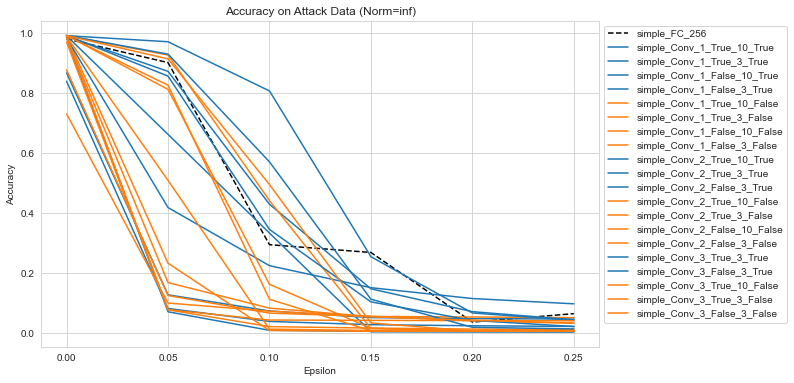

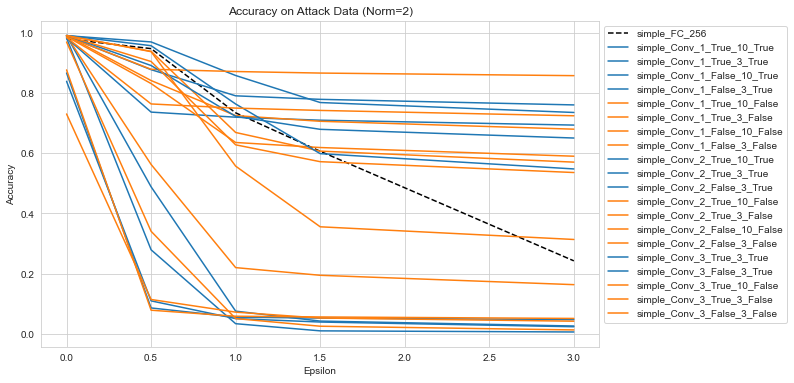

In [31]:
dense_colors = {
    True: (31/255, 119/255, 180/255),   # Blue
    False: (255/255, 127/255, 14/255),  # Orange
}
plot_by_param_sns(norms,model_names,accuracy_data,dense_colors,param_,filter_by_layers=False, n_layer=1)

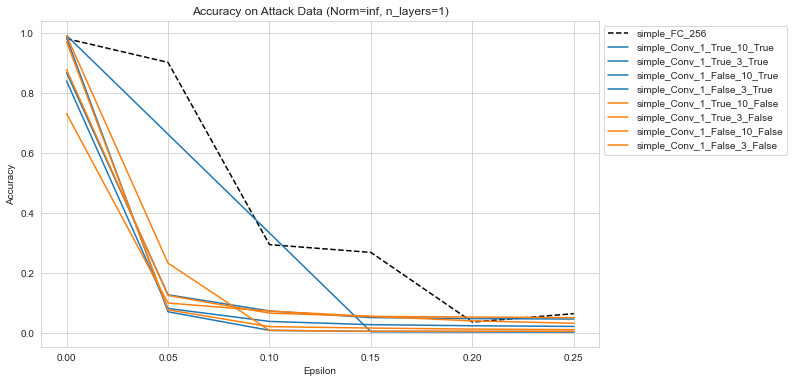

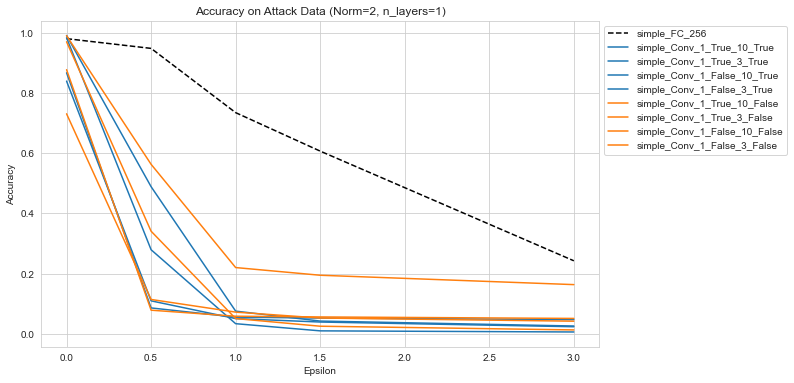

In [32]:
plot_by_param_sns(norms,model_names,accuracy_data,dense_colors,param_,filter_by_layers=True, n_layer=1)

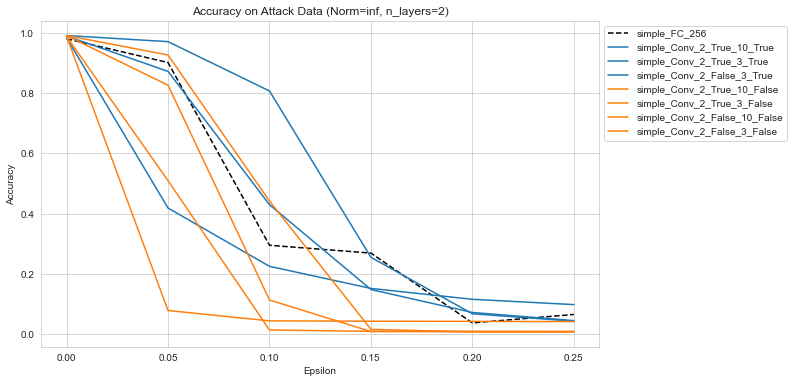

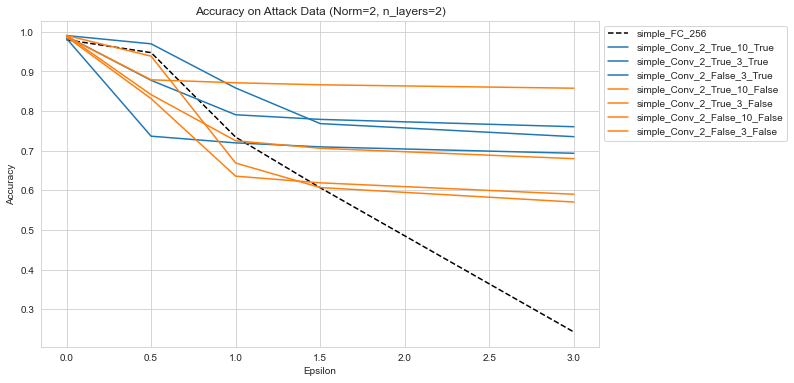

In [33]:
plot_by_param_sns(norms,model_names,accuracy_data,dense_colors,param_,filter_by_layers=True, n_layer=2)

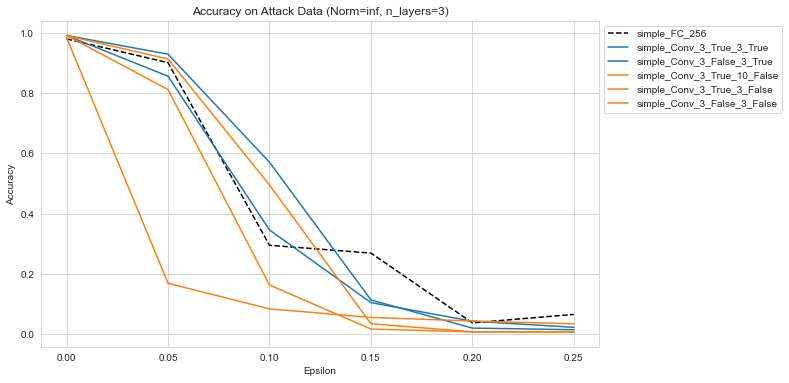

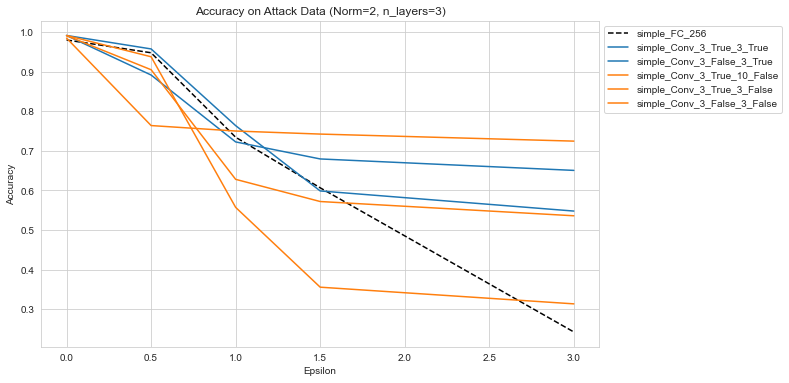

In [34]:
plot_by_param_sns(norms,model_names,accuracy_data,dense_colors,param_,filter_by_layers=True, n_layer=3)

### Averaging on values

In [35]:
gc.collect()

116688

In [36]:
# We will see the average values by parameters (using boxplots)
accuracy_data_ = {model: values for model, values in accuracy_data[np.inf].items() if model != "simple_FC_256"}

# if you didnt remove the untrained models, use the commented line below:
#accuracy_data_ = {model: values for model, values in accuracy_data[np.inf].items() if model not in  ['simple_Conv_2_False_10_True','simple_Conv_3_True_10_True','simple_Conv_3_False_10_True','simple_Conv_3_False_10_False','simple_FC_256'] }

acc_005 = {model: value for model, values in accuracy_data_.items() for epsilon, value in values if epsilon == 0.05}
acc_01 = {model: value for model, values in accuracy_data_.items() for epsilon, value in values if epsilon == 0.1}
acc_015 = {model: value for model, values in accuracy_data_.items() for epsilon, value in values if epsilon == 0.15}

In [37]:
from functions.Extension_utils import plot_violinplots, plot_boxplots
# use plot_violinplots for violinplots...

#### For epsilon = 0.1

Change epsilon to see the other values, we consider 0.1 as a good representation because the attack is not weak but also not strong to the point of not being able to compare models.

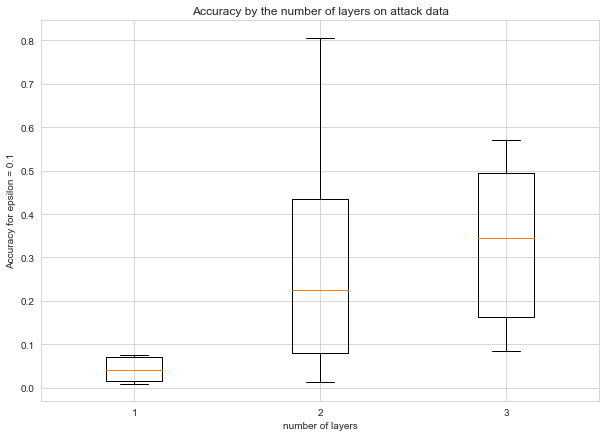

In [38]:
# Data for epsilon = 0.1, change epsilon to see the other values, we don
epsilon = 0.1
n_layers = ['1', '2', '3']
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[2] == X_label] for X_label in n_layers
]
#plot_violinplots
plot_boxplots(data_eps_01, n_layers, 'number of layers', f'Accuracy for epsilon = {epsilon}', 'Accuracy by the number of layers on attack data')

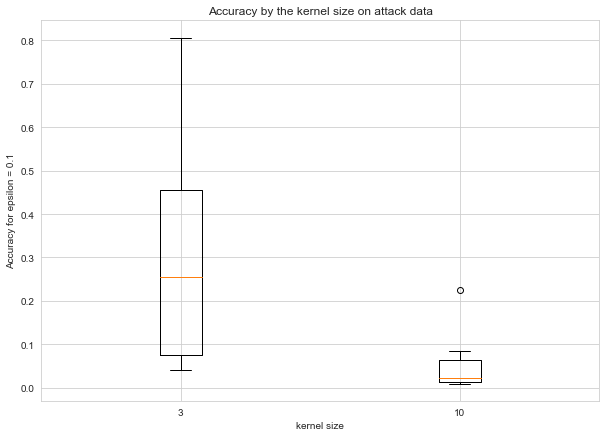

In [39]:
kernel_size = ['3', '10']
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[4] == X_label] for X_label in kernel_size
]
#plot_violinplots
plot_boxplots(data_eps_01, kernel_size, 'kernel size', f'Accuracy for epsilon = {epsilon}', 'Accuracy by the kernel size on attack data')

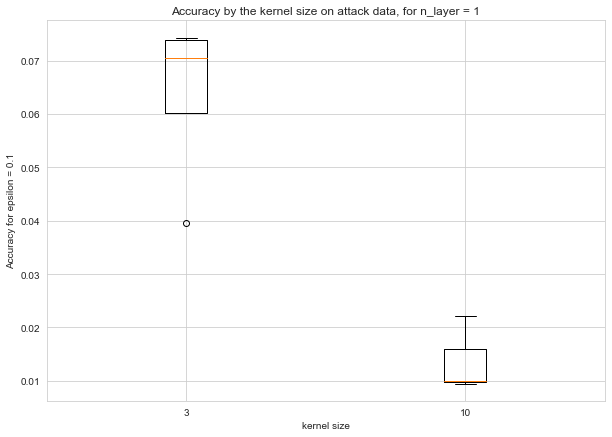

In [40]:
# Kenerl size by the number of layers
n_layer = '1'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[4] == X_label and model.split('_')[2] == n_layer] for X_label in kernel_size
]
plot_boxplots(data_eps_01, kernel_size, 'kernel size', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the kernel size on attack data, for n_layer = {n_layer}')

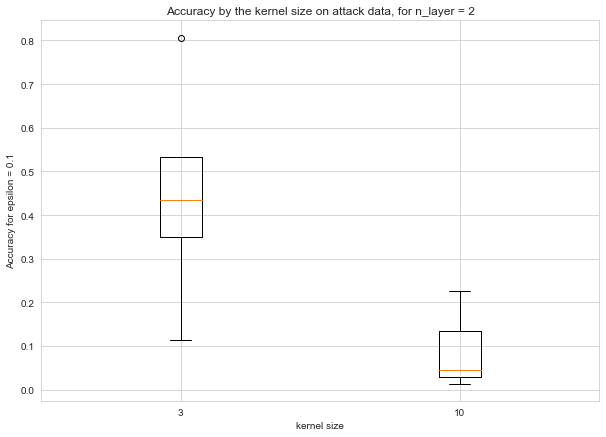

In [41]:
n_layer = '2'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[4] == X_label and model.split('_')[2] == n_layer] for X_label in kernel_size
]

plot_boxplots(data_eps_01, kernel_size, 'kernel size', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the kernel size on attack data, for n_layer = {n_layer}')

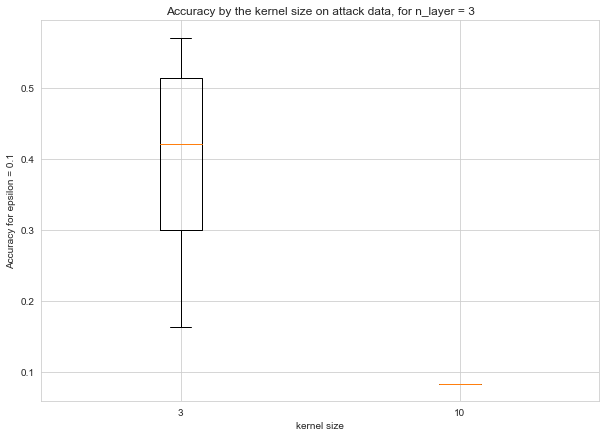

In [42]:
n_layer = '3'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[4] == X_label and model.split('_')[2] == n_layer] for X_label in kernel_size
]

plot_boxplots(data_eps_01, kernel_size, 'kernel size', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the kernel size on attack data, for n_layer = {n_layer}')

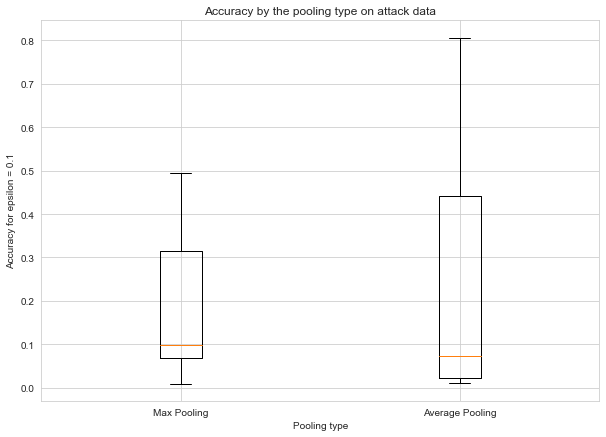

In [43]:
pooling_type = ['True', 'False']
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[3] == X_label] for X_label in pooling_type
]
#plot_violinplots
plot_boxplots(data_eps_01, ['Max Pooling', 'Average Pooling'], 'Pooling type', f'Accuracy for epsilon = {epsilon}', 'Accuracy by the pooling type on attack data')



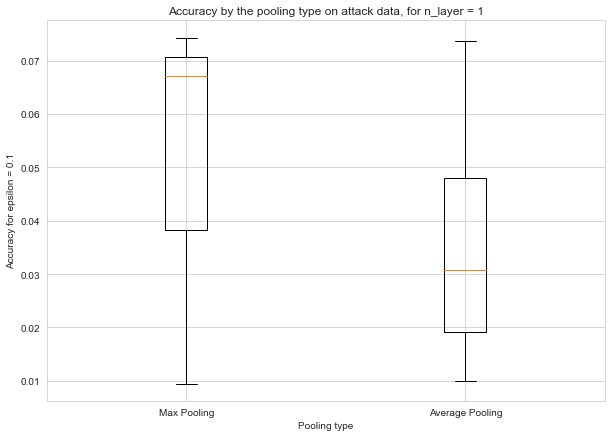

In [44]:
n_layer = '1'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[3] == X_label and model.split('_')[2] == n_layer] for X_label in pooling_type
]
#plot_violinplots
plot_boxplots(data_eps_01, ['Max Pooling', 'Average Pooling'], 'Pooling type', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the pooling type on attack data, for n_layer = {n_layer}')

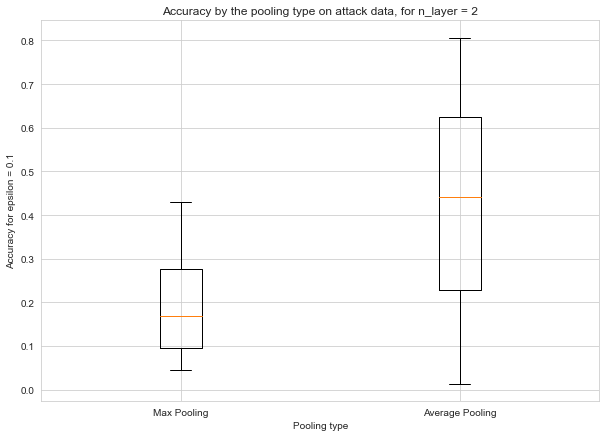

In [45]:
n_layer = '2'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[3] == X_label and model.split('_')[2] == n_layer] for X_label in pooling_type
]
#plot_violinplots
plot_boxplots(data_eps_01, ['Max Pooling', 'Average Pooling'], 'Pooling type', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the pooling type on attack data, for n_layer = {n_layer}')

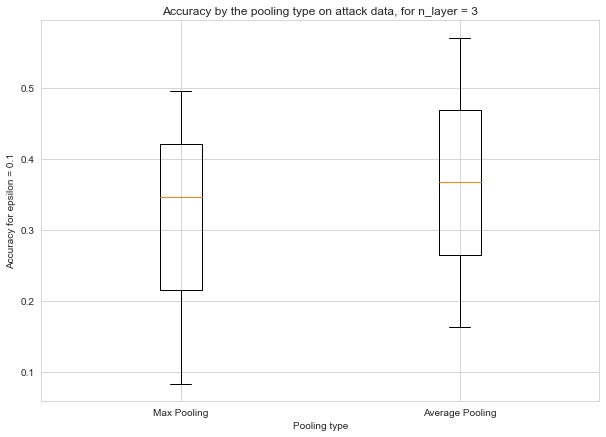

In [46]:
n_layer = '3'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[3] == X_label and model.split('_')[2] == n_layer] for X_label in pooling_type
]
#plot_violinplots
plot_boxplots(data_eps_01, ['Max Pooling', 'Average Pooling'], 'Pooling type', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the pooling type on attack data, for n_layer = {n_layer}')

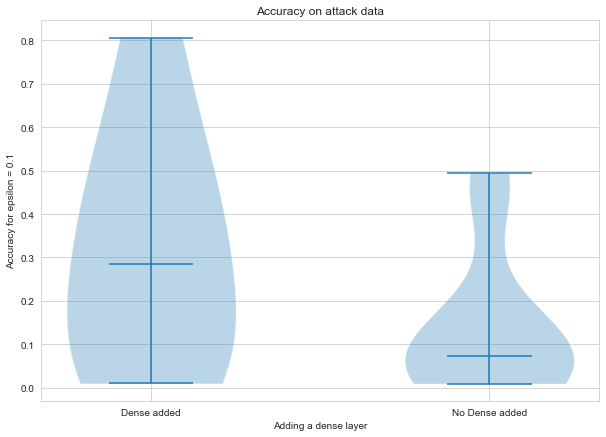

In [47]:
dense_added = ['True', 'False']
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[5] == X_label] for X_label in dense_added
]
#plot_violinplots
plot_violinplots(data_eps_01, ['Dense added', 'No Dense added'], 'Adding a dense layer', f'Accuracy for epsilon = {epsilon}', 'Accuracy on attack data')


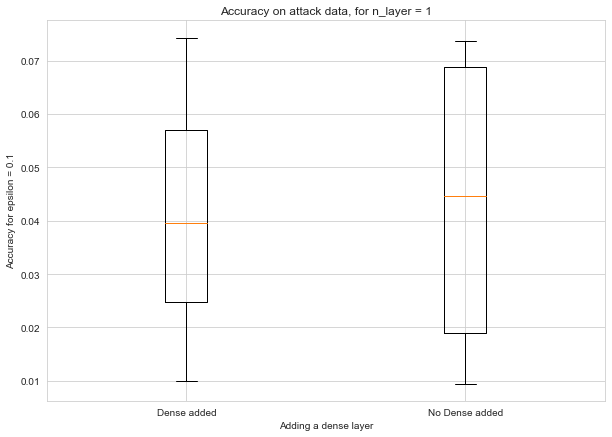

In [48]:
n_layer = '1'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[5] == X_label and model.split('_')[2] == n_layer] for X_label in dense_added
]
#plot_violinplots
plot_boxplots(data_eps_01, ['Dense added', 'No Dense added'], 'Adding a dense layer', f'Accuracy for epsilon = {epsilon}', f'Accuracy on attack data, for n_layer = {n_layer}')

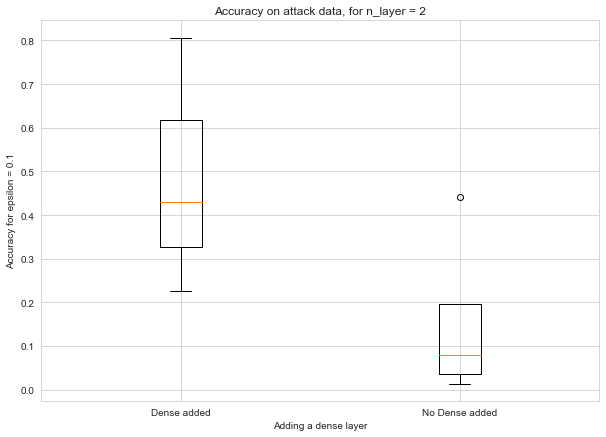

In [49]:
n_layer = '2'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[5] == X_label and model.split('_')[2] == n_layer] for X_label in dense_added
]
#plot_violinplots
plot_boxplots(data_eps_01, ['Dense added', 'No Dense added'], 'Adding a dense layer', f'Accuracy for epsilon = {epsilon}', f'Accuracy on attack data, for n_layer = {n_layer}')

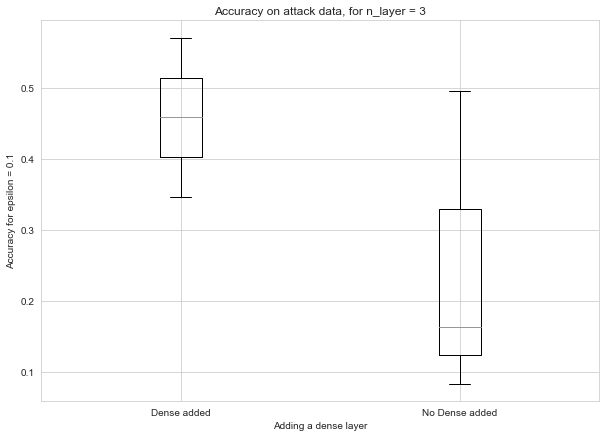

In [50]:
n_layer = '3'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[5] == X_label and model.split('_')[2] == n_layer] for X_label in dense_added
]
#plot_violinplots
plot_boxplots(data_eps_01, ['Dense added', 'No Dense added'], 'Adding a dense layer', f'Accuracy for epsilon = {epsilon}', f'Accuracy on attack data, for n_layer = {n_layer}')

### Shift Consistency

The maximum shift used mainly is 10. We use the same shift consistency score as in the paper and reproduction phase. We tried other maxshifts later.

In [51]:
with open('data/mnist_extension/consistency/mnist_model_consistency_dict.pkl', 'rb') as file:
    model_consistency_dict = pickle.load(file)


from tabulate import tabulate
table = []
for model_name, model_consistency in model_consistency_dict.items():
    table.append([model_name, "{:.2f}%".format(100. * model_consistency)])

headers = ["Model Name", "Consistency"]
print(tabulate(table, headers, tablefmt="grid"))

+------------------------------+---------------+
| Model Name                   | Consistency   |
+==============================+===============+
| simple_FC_256                | 28.88%        |
+------------------------------+---------------+
| simple_Conv_1_True_10_True   | 66.95%        |
+------------------------------+---------------+
| simple_Conv_1_True_3_True    | 58.32%        |
+------------------------------+---------------+
| simple_Conv_1_False_10_True  | 65.03%        |
+------------------------------+---------------+
| simple_Conv_1_False_3_True   | 50.79%        |
+------------------------------+---------------+
| simple_Conv_1_True_10_False  | 68.97%        |
+------------------------------+---------------+
| simple_Conv_1_True_3_False   | 58.56%        |
+------------------------------+---------------+
| simple_Conv_1_False_10_False | 64.50%        |
+------------------------------+---------------+
| simple_Conv_1_False_3_False  | 56.12%        |
+-------------------

In [52]:
with open('data/mnist_extension/consistency/mnist_model_consistency_dict_5.pkl', 'rb') as file:
    model_consistency_dict_5 = pickle.load(file)
with open('data/mnist_extension/consistency/mnist_model_consistency_dict_6.pkl', 'rb') as file:
    model_consistency_dict_6 = pickle.load(file)
with open('data/mnist_extension/consistency/mnist_model_consistency_dict_4.pkl', 'rb') as file:
    model_consistency_dict_4 = pickle.load(file)

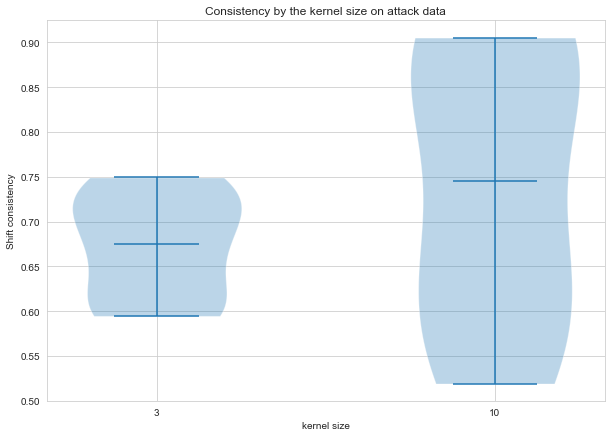

In [53]:
# Plot of consistency by kerel size (you can try other plots using similar code
#data_01 = [
#    [value for model, value in model_consistency_dict.items() if model not in ['simple_FC_2_256','simple_FC_3_512'] and model.split('_')[4] == X_label and model.split('_')[2] == n_layer] for X_label in kernel_size_
#]
kernel_size_ = ['3', '10']
data_01 = [
    [value for model, value in model_consistency_dict_5.items() if model not in ['simple_FC_256'] and model in list(accuracy_data[np.inf].keys()) and model.split('_')[4] == X_label ] for X_label in kernel_size_
]
plot_violinplots(data_01, kernel_size_, 'kernel size', f'Shift consistency', f'Consistency by the kernel size on attack data')

We make an array to include both robust accuracy and consistency.

In [54]:
from functions.Extension_utils import get_acc_consi_epsi
get_acc_consi_epsi(model_consistency_dict,accuracy_data)

[('simple_Conv_1_True_3_True', 0.0743, 0.5832),
 ('simple_Conv_1_False_10_True', 0.0099, 0.6503),
 ('simple_Conv_1_False_3_True', 0.0395, 0.5079),
 ('simple_Conv_1_True_10_False', 0.0095, 0.6897),
 ('simple_Conv_1_True_3_False', 0.0671, 0.5856),
 ('simple_Conv_1_False_10_False', 0.0222, 0.645),
 ('simple_Conv_1_False_3_False', 0.0737, 0.5612),
 ('simple_Conv_2_True_10_True', 0.2251, 0.2211),
 ('simple_Conv_2_True_3_True', 0.4295, 0.2457),
 ('simple_Conv_2_False_3_True', 0.8067, 0.2739),
 ('simple_Conv_2_True_10_False', 0.0442, 0.2344),
 ('simple_Conv_2_True_3_False', 0.1134, 0.2601),
 ('simple_Conv_2_False_10_False', 0.0139, 0.2293),
 ('simple_Conv_2_False_3_False', 0.4417, 0.2711),
 ('simple_Conv_3_True_3_True', 0.3457, 0.3338),
 ('simple_Conv_3_False_3_True', 0.5706, 0.286),
 ('simple_Conv_3_True_10_False', 0.0838, 0.2849),
 ('simple_Conv_3_True_3_False', 0.4951, 0.3223),
 ('simple_Conv_3_False_3_False', 0.163, 0.3243),
 ('simple_FC_256', 0.2949, 0.2888)]

### Graph Shift-Invariance-Adversarial-Robustness

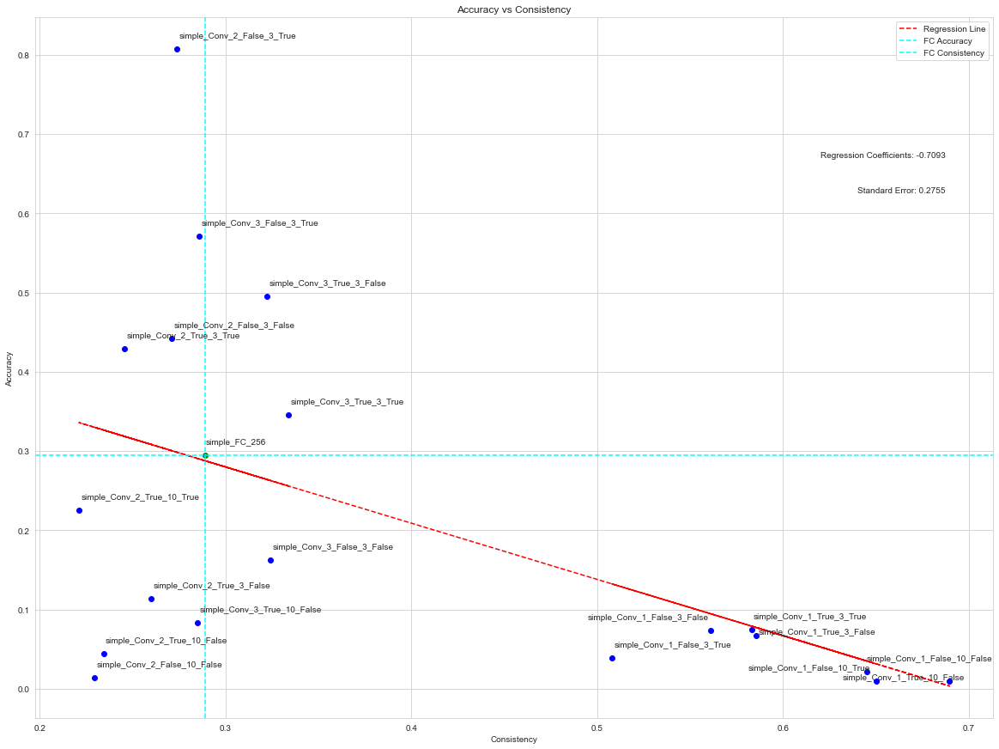

In [55]:
from functions.Extension_utils import plot_acc_consi
plot_acc_consi(get_acc_consi_epsi(model_consistency_dict,accuracy_data), conf_interval = False, mean_lines = False, fc_lines = True)

In [56]:
# To try other combinations, uncomment one of  following lines
#plot_acc_consi(get_acc_consi_epsi(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.05), conf_interval = False, mean_lines = False, fc_lines = True)
#plot_acc_consi(get_acc_consi_epsi(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.1), conf_interval = False, mean_lines = False, fc_lines = True)
## max shift = 5
#plot_acc_consi(get_acc_consi_epsi(model_consistency_dict_5,accuracy_data, norm = np.inf, epsilon_ = 0.1), conf_interval = False, mean_lines = False, fc_lines = True)
#plot_acc_consi(get_acc_consi_epsi(model_consistency_dict_4,accuracy_data, norm = np.inf, epsilon_ = 0.1), conf_interval = False, mean_lines = False, fc_lines = True)
#plot_acc_consi(get_acc_consi_epsi(model_consistency_dict_6,accuracy_data, norm = np.inf, epsilon_ = 0.1), conf_interval = False, mean_lines = False, fc_lines = True)
#plot_acc_consi(get_acc_consi_epsi(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.15), conf_interval = False, mean_lines = False, fc_lines = True)

### <h3 style="background-color:#56cbf9;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>MNIST </centre></strong></h3>

The script used here is `scripts/pooling_and_layers_scale_inf_epsilon.py`, and the only difference is that we are using `attack_params = [[2, [2, 5,  10, 25]]]` instead of `attack_params = [[np.inf, [0.05, 0.1,  0.15, 0.2, 0.25, 0.3]],[2, [0.5, 1, 1.5,  2.5, 3]]]` because the models were not affected enough by the norm 2 attack previously.

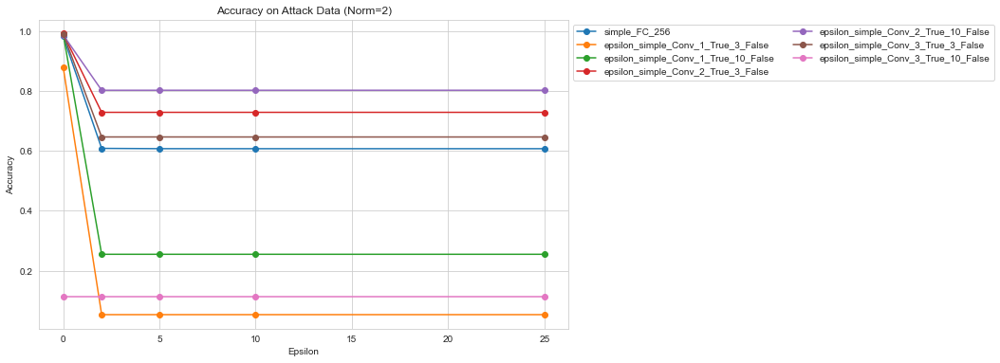

In [57]:
with open('data/mnist_epsilon/epsilon_mnist_accuracy_data.pkl', 'rb') as file:
    accuracy_data_eps = pickle.load(file)
with open('data/mnist_epsilon/epsilon_mnist_model_names.pkl', 'rb') as file:
    model_names_eps = pickle.load(file)
attack_params = [[2, [2, 5,  10, 25]]]
import matplotlib.pyplot as plt
norms = [attack_params[0][0]]
epsilons = {
    attack_params[0][0]: attack_params[0][1]
}
for norm in norms:
    plt.figure(figsize=(10, 6))  # Increase the figure size for better spacing

    for model_name in model_names_eps:
        accuracies = accuracy_data_eps[norm][model_name]
        eps, accs = zip(*accuracies)
        plt.plot(eps, accs, marker='o', label=model_name)

    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    plt.title(f"Accuracy on Attack Data (Norm={norm})")

    # Place the legend outside the plot area to avoid overlapping
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=2)

    plt.show()

Increasing the value of epsilon does not improve the attack for the norm 2 attack.

### <h2 style="background-color:#56cbf9;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Fashion MNIST </centre></strong></h3>

The script used is `scripts/pooling_and_layers_fashion.py`.

In [58]:
gc.collect()

57554

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, ReLU, GlobalAveragePooling2D, Dense, Lambda, Flatten, GlobalMaxPooling2D, MaxPooling2D, AveragePooling2D
from tests.utils import master_seed
import pickle

In [61]:
from functions.extension_models_fashion import  simple_FC, circular_padding, simple_Conv
# Load the data from the saved files
with open('data/fashion_extension/fashion_mnist_acc_array.pkl', 'rb') as file:
    acc_array = pickle.load(file)
with open('data/fashion_extension/fashion_mnist_loss_array.pkl', 'rb') as file:
    loss_array = pickle.load(file)
with open('data/fashion_extension/fashion_mnist_accuracy_data.pkl', 'rb') as file:
    accuracy_data = pickle.load(file)
with open('data/fashion_extension/fashion_mnist_model_names.pkl', 'rb') as file:
    model_names = pickle.load(file)
with open('data/fashion_extension/fashion_mnist_model_consistency_dict.pkl', 'rb') as file:
    model_consistency_dict = pickle.load(file)

In [62]:
# Define the attack parameters
attack_params = [[np.inf, [0.05, 0.1,  0.15, 0.2]],[2, [0.5, 1,  1.5, 2]]]
norms = [attack_params[0][0], attack_params[1][0]]
epsilons = {
    attack_params[0][0]: attack_params[0][1],
    attack_params[1][0]: attack_params[1][1]
}
# loading the models
models = []
model_names_ = list(model_names.keys())
# [classifier, test_acc, train_acc, test_loss, train_loss]
for i, model_name in enumerate(model_names_):
    model_file = f'data/fashion_extension/{model_name}.h5'
    model = tf.keras.models.load_model(model_file,  compile=False )
    accuracy_test= acc_array[i][0]
    accuracy_train= acc_array[i][1]
    loss_test = loss_array[i][0]
    loss_train = loss_array[i][0]
    models.append((model, accuracy_test,accuracy_train, loss_test,loss_train))

In [63]:
import plotly.graph_objects as go
import plotly.io as pio
fig_traces = []
for model_name, (_,_,_,test_loss,train_loss) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_loss)), y=train_loss, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_loss)), y=test_loss, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Loss'),
    title='Training and Validation Loss',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)

In [64]:
fig_traces = []
for model_name, (_, test_acc, train_acc,_,_) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_acc)), y=train_acc, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_acc)), y=test_acc, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Accuracy'),
    title='Training and Validation Accuracy',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)

### <h3 style="background-color:#56cbf9;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Results </centre></strong></h3>

In [65]:
import plotly.graph_objects as go
for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        # Set the line style based on the model name
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
        fig.add_trace(go.Scatter(x=eps, y=accs, mode='lines+markers', name=model_name, line=dict(dash=line_dash)))
    fig.update_layout(
        xaxis_title='Epsilon',
        yaxis_title='Accuracy',
        title=f'Accuracy on Attack Data (Norm={norm})',
        showlegend=True
    )
    fig.show()

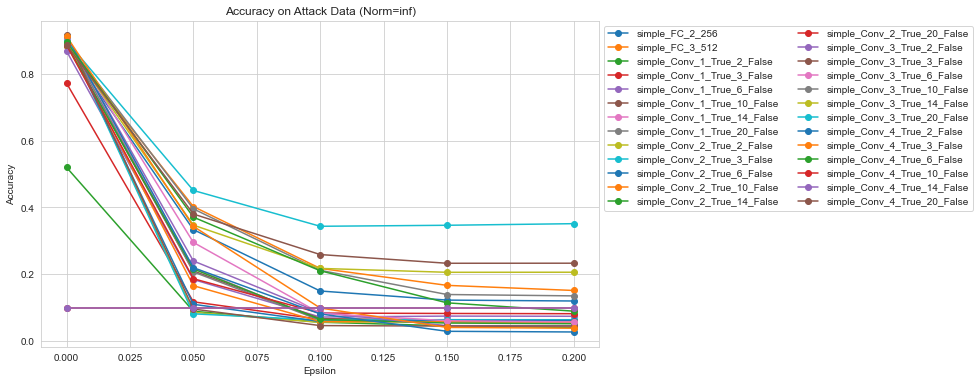

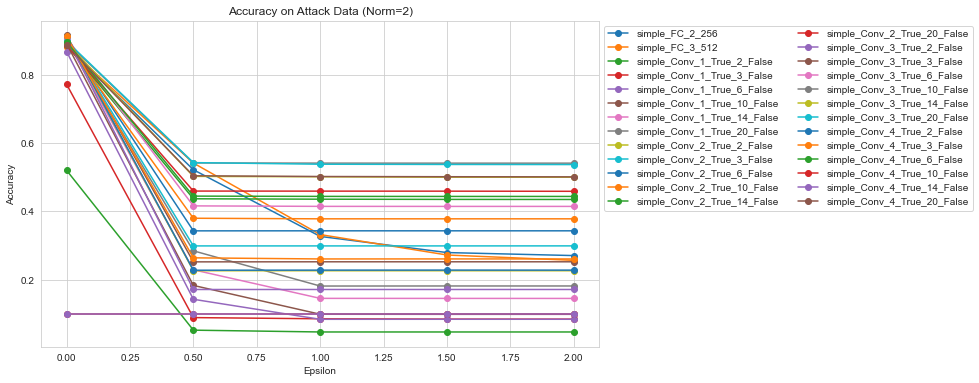

In [66]:
for norm in norms:
    plt.figure(figsize=(10, 6))  # Increase the figure size for better spacing

    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        plt.plot(eps, accs, marker='o', label=model_name)

    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    plt.title(f"Accuracy on Attack Data (Norm={norm})")

    # Place the legend outside the plot area to avoid overlapping
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=2)

    plt.show()

In [67]:
# the data is complated this can be verified with this cell
#import plotly.graph_objects as go
#for norm in norms:
#    fig = go.Figure()
#    for model_name in model_names:
#        accuracies = accuracy_data[norm][model_name]
#        if len(accuracies)<4:
#            print(model_name,accuracies)

### Removing untrained models
Skip this part if you want to have all the models in the plot:

In [68]:
model_acc = [(model_name, test_acc[-1]) for model_name, (_, test_acc, train_acc,_,_) in zip(model_names.keys(), models)]
# print(min([accuracy for (model_name, accuracy) in model_acc]))
# print(max([accuracy for (model_name, accuracy) in model_acc]))
# Lets consider a limit of 0.2 (it is actually higher than that but the untrained models accuracy stays around 0.1, random)
models_to_remove = [model_name for (model_name, accuracy) in model_acc if accuracy<0.2]
print("models to remove: ", models_to_remove)
model_acc = [item for item in model_acc if item[0] not in models_to_remove]
#print(min([accuracy for (model_name, accuracy) in model_acc]))
models_to_remove_temp = []
# Iterate over the dictionary to identify models to remove
for norm, norm_data in accuracy_data.items():
    for model_name in norm_data:
        if model_name in models_to_remove:
            #print(norm, model_name)
            models_to_remove_temp.append((norm, model_name))

for norm, model_name in models_to_remove_temp:
    del accuracy_data[norm][model_name]
index_ = 0
indices_to_remove = []
for model_name, function in model_names.items():
    if  model_name in models_to_remove:
        #print(model_name)
        indices_to_remove.append(index_)
    index_+=1

for model_name in models_to_remove:
    del model_names[model_name]

#print(indices_to_remove)
models  = [models.pop(index) for index in sorted(indices_to_remove, reverse=True)]

models to remove:  ['simple_Conv_4_True_10_False', 'simple_Conv_4_True_14_False']


In [69]:
%xdel model_acc
%xdel indices_to_remove
%xdel models_to_remove_temp
%xdel index_
%xdel models_to_remove
import gc
gc.collect()

32901

Now, as we did with the MNIST dataset we will plot by parameter:

### By number of layers


In [70]:
layers_colors = {
    1: 'rgb(0, 0, 255)',    # Blue
    2: 'rgb(255, 255, 0)',    # Yellow
    3: 'rgb(0, 255, 0)',     # Green
    4: 'rgb(255, 0, 0)',     # Red
}
param_ = "nlayers"
plot_by_param(norms,model_names,accuracy_data,layers_colors,param_,filter_by_layers=False, n_layer=1)

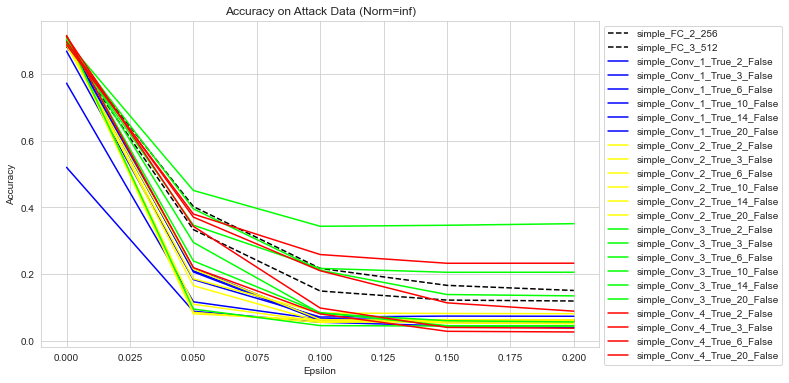

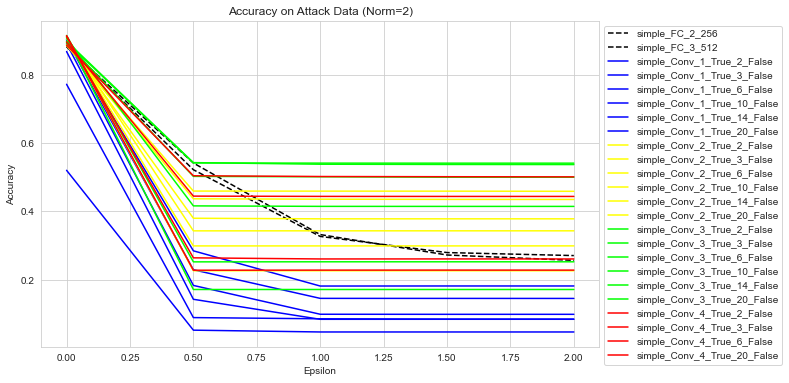

In [71]:
layers_colors = {
    1: (0/255, 0/255, 255/255),    # Blue
    2: (255/255, 255/255, 0/255),    # Yellow
    3: (0/255, 255/255, 0/255),     # Green
    4: (255/255, 0/255, 0/255),     # Red
}
param_ = "nlayers"

plot_by_param_sns(norms,model_names,accuracy_data,layers_colors,param_,filter_by_layers=False, n_layer=1)

###  By kernel size

In [72]:
kernel_colors = {
    2: 'rgb(255, 0, 0)',   # red
    3: 'rgb(255, 120, 0)',  # Orange
    6: 'rgb(255, 255, 0)',   # yrllox
    10: 'rgb(0, 255, 0)',    # green
    14: 'rgb(0, 0, 255)', # blue
    20: 'rgb(75, 0, 175)',  # purple
}
param_ ="kernels"
plot_by_param(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=False, n_layer=1)

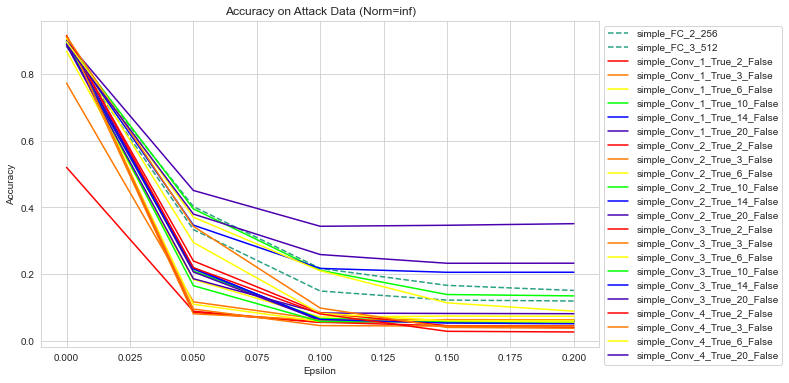

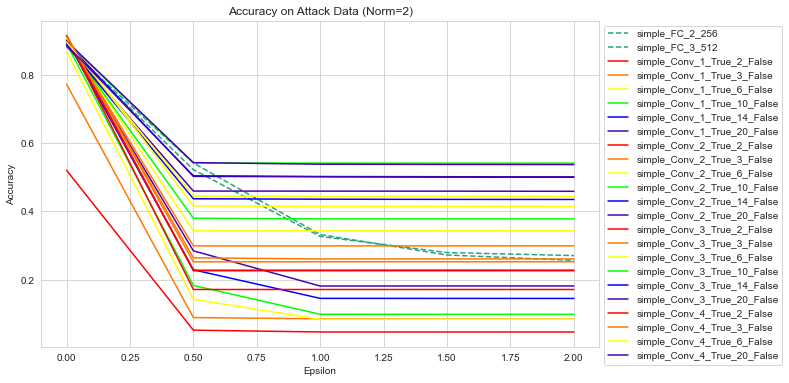

In [73]:
kernel_colors = {
    2:  (255/255, 0/255, 0/255),   # red
    3:  (255/255, 120/255, 0/255),  # Orange
    6:  (255/255, 255/255, 0/255),   # yellow
    10: (0/255, 255/255, 0/255),    # green
    14: (0/255, 0/255, 255/255), # blue
    20: (75/255, 0/255, 175/255),  # purple
}
plot_by_param_sns(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=False, n_layer=1)

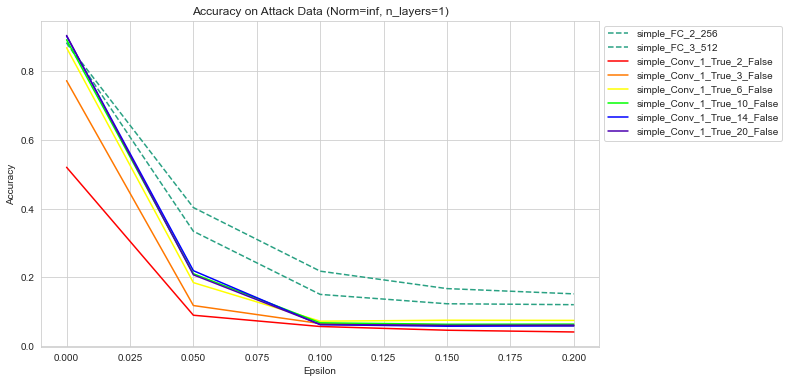

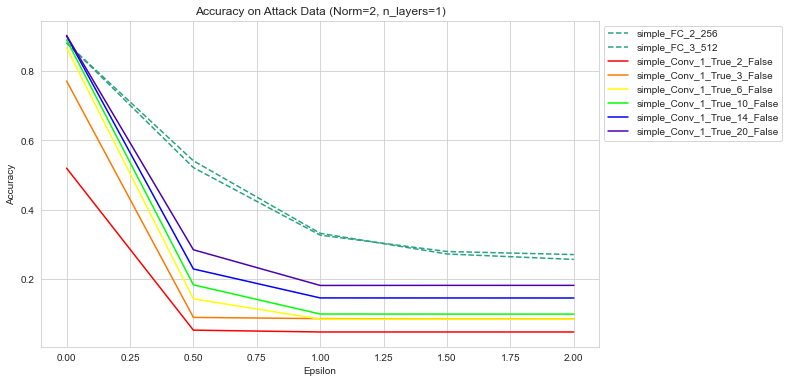

In [74]:
plot_by_param_sns(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=True, n_layer=1)

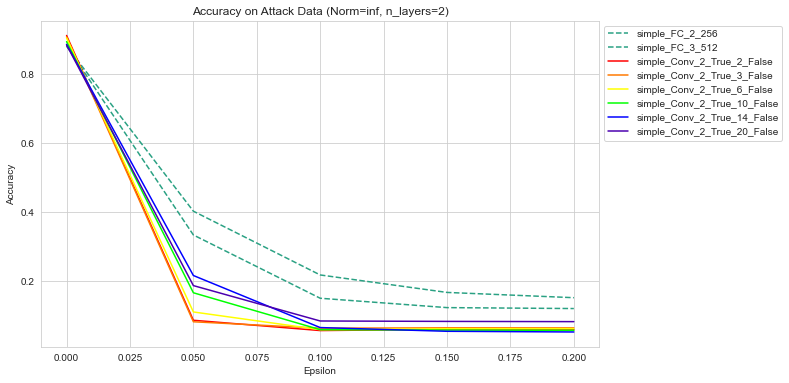

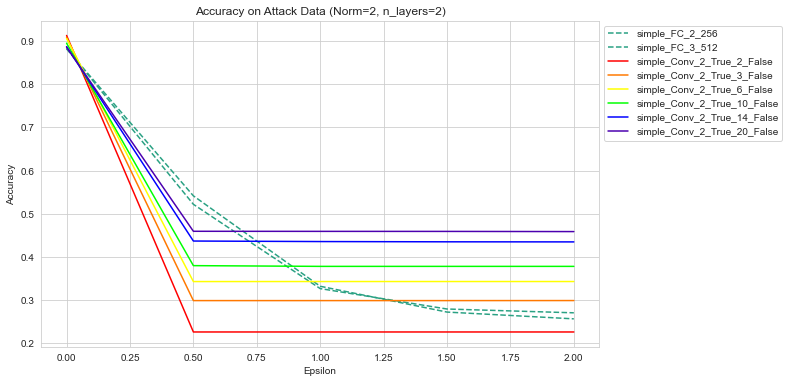

In [75]:
plot_by_param_sns(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=True, n_layer=2)

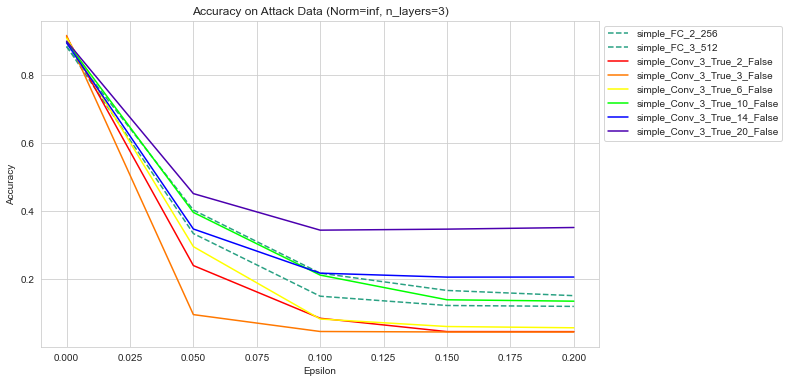

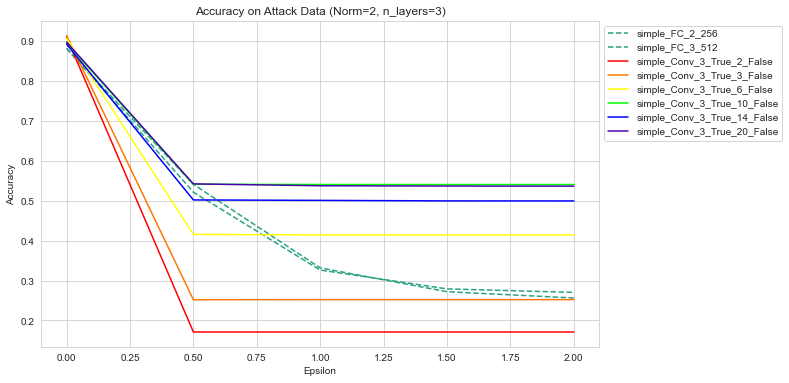

In [76]:
plot_by_param_sns(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=True, n_layer=3)

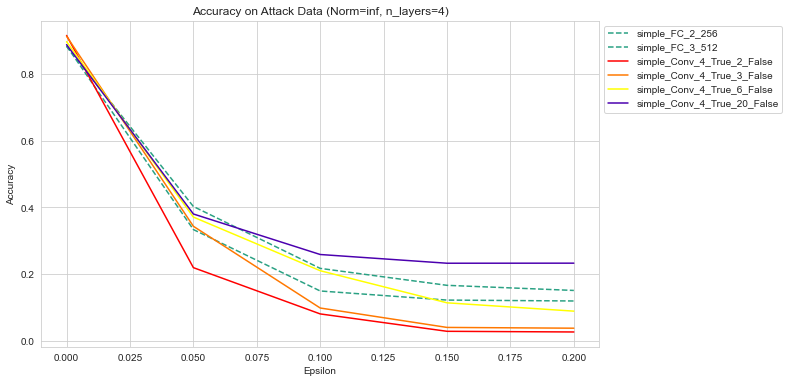

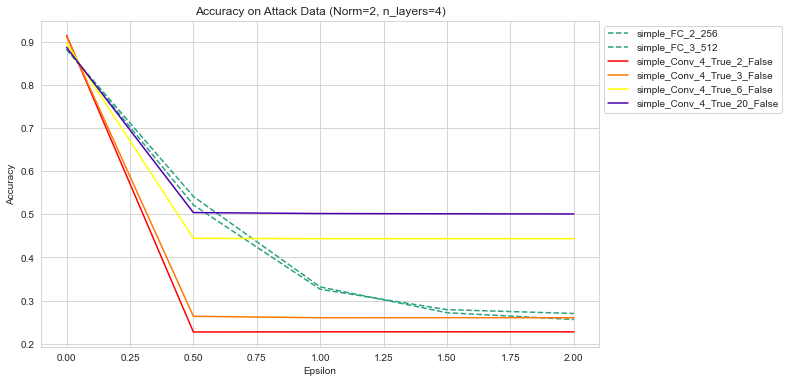

In [77]:
plot_by_param_sns(norms,model_names,accuracy_data,kernel_colors,param_,filter_by_layers=True, n_layer=4)

### Averaging on values

In [78]:
gc.collect()

63537

In [79]:
accuracy_data_ = {model: values for model, values in accuracy_data[np.inf].items() if model not in ["simple_FC_2_256","simple_FC_3_512" ]}

# if you didnt remove the untrained models, use the commented line below:
#accuracy_data_ = {model: values for model, values in accuracy_data[np.inf].items() if model not in  ['simple_Conv_2_False_10_True','simple_Conv_3_True_10_True','simple_Conv_3_False_10_True','simple_Conv_3_False_10_False','simple_FC_256'] }

acc_005 = {model: value for model, values in accuracy_data_.items() for epsilon, value in values if epsilon == 0.05}
acc_01 = {model: value for model, values in accuracy_data_.items() for epsilon, value in values if epsilon == 0.1}
acc_015 = {model: value for model, values in accuracy_data_.items() for epsilon, value in values if epsilon == 0.15}

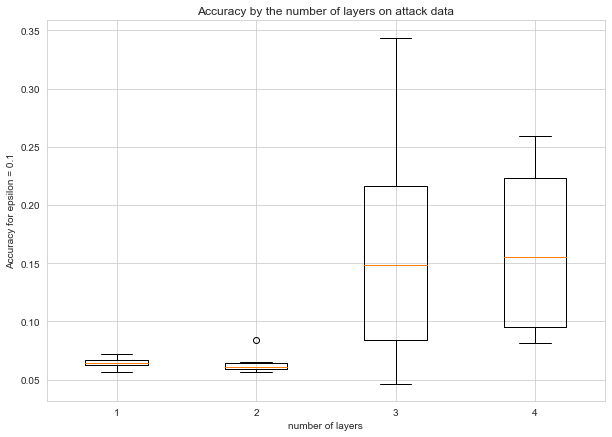

In [80]:
# Data for epsilon = 0.1
epsilon = 0.1
n_layers = ['1', '2', '3', '4']
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[2] == X_label] for X_label in n_layers
]
#plot_violinplots
plot_boxplots(data_eps_01, n_layers, 'number of layers', f'Accuracy for epsilon = {epsilon}', 'Accuracy by the number of layers on attack data')

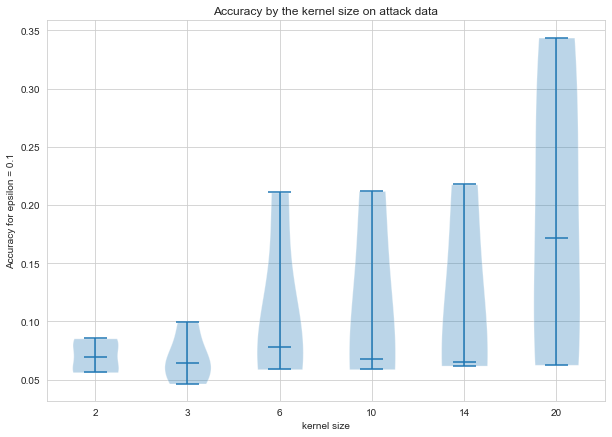

In [81]:
kernel_size = ['2', '3','6', '10','14', '20']
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[4] == X_label] for X_label in kernel_size
]
#plot_boxplots()
plot_violinplots(data_eps_01, kernel_size, 'kernel size', f'Accuracy for epsilon = {epsilon}', 'Accuracy by the kernel size on attack data')

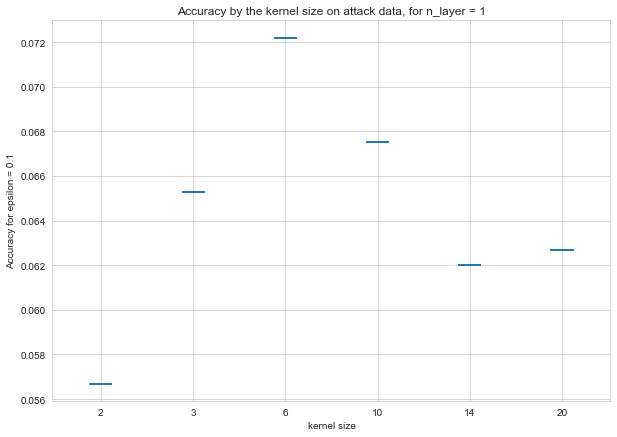

In [82]:
n_layer = '1'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[4] == X_label and model.split('_')[2] == n_layer] for X_label in kernel_size
]

plot_violinplots(data_eps_01, kernel_size, 'kernel size', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the kernel size on attack data, for n_layer = {n_layer}')

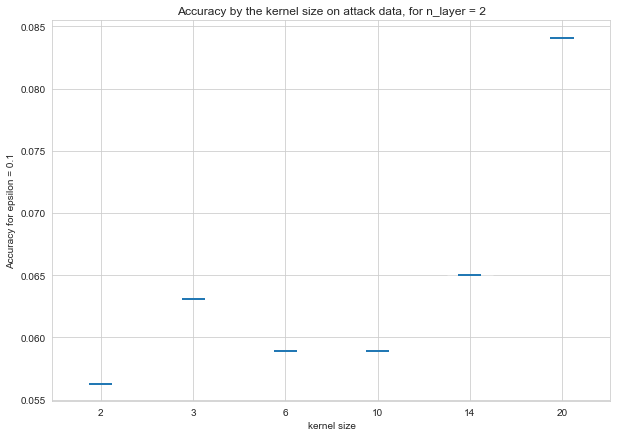

In [83]:
n_layer = '2'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[4] == X_label and model.split('_')[2] == n_layer] for X_label in kernel_size
]

plot_violinplots(data_eps_01, kernel_size, 'kernel size', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the kernel size on attack data, for n_layer = {n_layer}')

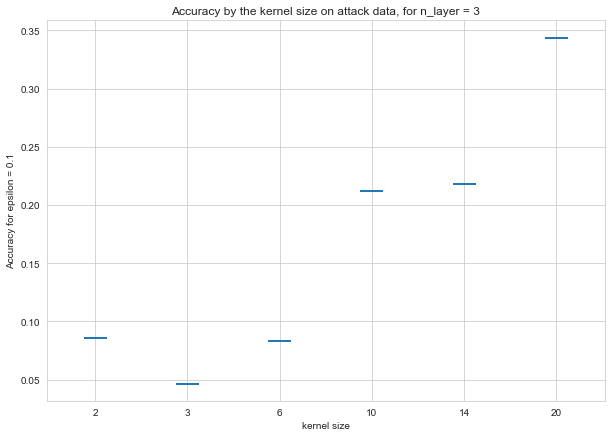

In [84]:
n_layer = '3'
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[4] == X_label and model.split('_')[2] == n_layer] for X_label in kernel_size
]

plot_violinplots(data_eps_01, kernel_size, 'kernel size', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the kernel size on attack data, for n_layer = {n_layer}')


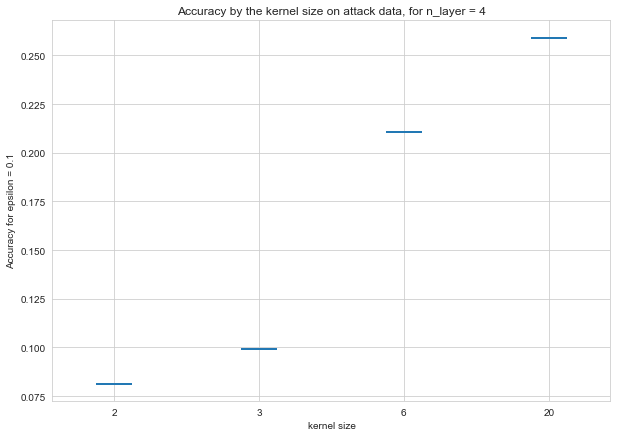

In [85]:
n_layer = '4'
kernel_size_ = ['2', '3', '6', '20']
data_eps_01 = [
    [value for model, value in acc_01.items() if model.split('_')[4] == X_label and model.split('_')[2] == n_layer] for X_label in kernel_size_
]

plot_violinplots(data_eps_01, kernel_size_, 'kernel size', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the kernel size on attack data, for n_layer = {n_layer}')

### Shift Consistency

In [86]:
from functions.Extension_utils import get_acc_consi_epsi_fashion, plot_acc_consi_fashion

In [87]:
# Combining robust accuracy and shift consistency
get_acc_consi_epsi_fashion(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.1)

[('simple_Conv_1_True_2_False', 0.0567, 0.5863),
 ('simple_Conv_1_True_3_False', 0.0653, 0.5493),
 ('simple_Conv_1_True_6_False', 0.0722, 0.5625),
 ('simple_Conv_1_True_10_False', 0.0675, 0.5532),
 ('simple_Conv_1_True_14_False', 0.062, 0.534),
 ('simple_Conv_1_True_20_False', 0.0627, 0.4499),
 ('simple_Conv_2_True_2_False', 0.0563, 0.3458),
 ('simple_Conv_2_True_3_False', 0.0631, 0.3034),
 ('simple_Conv_2_True_6_False', 0.0589, 0.3057),
 ('simple_Conv_2_True_10_False', 0.0589, 0.2772),
 ('simple_Conv_2_True_14_False', 0.065, 0.3221),
 ('simple_Conv_2_True_20_False', 0.0841, 0.3007),
 ('simple_Conv_3_True_2_False', 0.0854, 0.3611),
 ('simple_Conv_3_True_3_False', 0.0466, 0.3652),
 ('simple_Conv_3_True_6_False', 0.0832, 0.3473),
 ('simple_Conv_3_True_10_False', 0.212, 0.3327),
 ('simple_Conv_3_True_14_False', 0.2177, 0.3612),
 ('simple_Conv_3_True_20_False', 0.3438, 0.3625),
 ('simple_Conv_4_True_2_False', 0.0815, 0.4144),
 ('simple_Conv_4_True_3_False', 0.0992, 0.342),
 ('simple_Conv_4

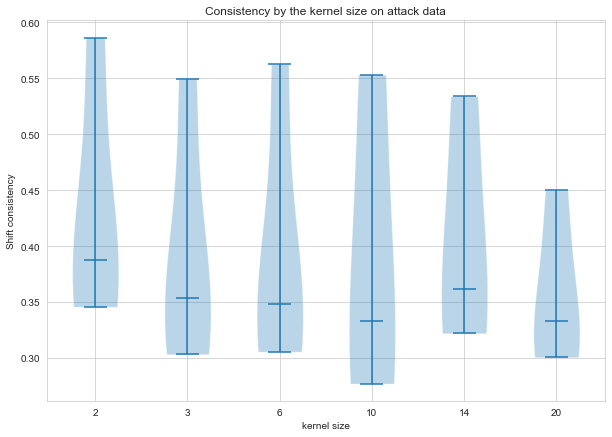

In [88]:
kernel_size = ['2', '3','6', '10','14', '20']
# if we want to do it by layer
#data_01 = [
#    [value for model, value in model_consistency_dict.items() if model not in ['simple_FC_2_256','simple_FC_3_512'] and model.split('_')[4] == X_label and model.split('_')[2] == n_layer] for X_label in kernel_size_
#]
data_01 = [
    [value for model,_ ,value in get_acc_consi_epsi_fashion(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.1) if model not in ['simple_FC_2_256','simple_FC_3_512'] and model.split('_')[4] == X_label ] for X_label in kernel_size
]
plot_violinplots(data_01, kernel_size, 'kernel size', f'Shift consistency', f'Consistency by the kernel size on attack data')

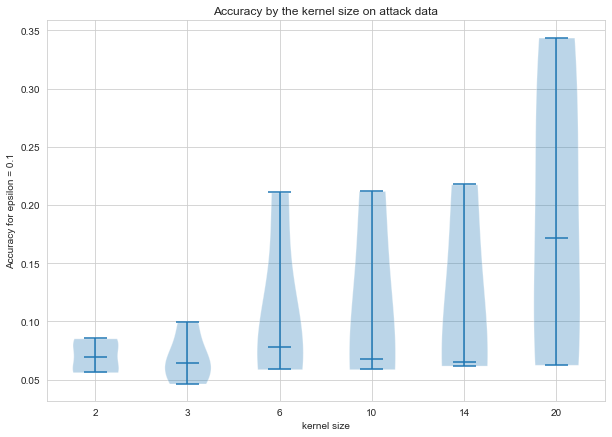

In [89]:
# Now let's compare the kernel size effect on robust accuracy
data_01 = [
    [value for model,value in acc_01.items() if model not in ['simple_FC_2_256','simple_FC_3_512'] and model.split('_')[4] == X_label ] for X_label in kernel_size
]
plot_violinplots(data_01, kernel_size, 'kernel size', f'Accuracy for epsilon = {epsilon}', f'Accuracy by the kernel size on attack data')

In [90]:
from tabulate import tabulate
table = []
for model_name, model_consistency in model_consistency_dict.items():
    table.append([model_name, "{:.2f}%".format(100. * model_consistency)])
headers = ["Model Name", "Consistency"]
print(tabulate(table, headers, tablefmt="grid"))

+-----------------------------+---------------+
| Model Name                  | Consistency   |
+=============================+===============+
| simple_FC_2_256             | 38.67%        |
+-----------------------------+---------------+
| simple_FC_3_512             | 34.48%        |
+-----------------------------+---------------+
| simple_Conv_1_True_2_False  | 58.63%        |
+-----------------------------+---------------+
| simple_Conv_1_True_3_False  | 54.93%        |
+-----------------------------+---------------+
| simple_Conv_1_True_6_False  | 56.25%        |
+-----------------------------+---------------+
| simple_Conv_1_True_10_False | 55.32%        |
+-----------------------------+---------------+
| simple_Conv_1_True_14_False | 53.40%        |
+-----------------------------+---------------+
| simple_Conv_1_True_20_False | 44.99%        |
+-----------------------------+---------------+
| simple_Conv_2_True_2_False  | 34.58%        |
+-----------------------------+---------

### Graph Shift-Invariance-Adversarial-Robustness

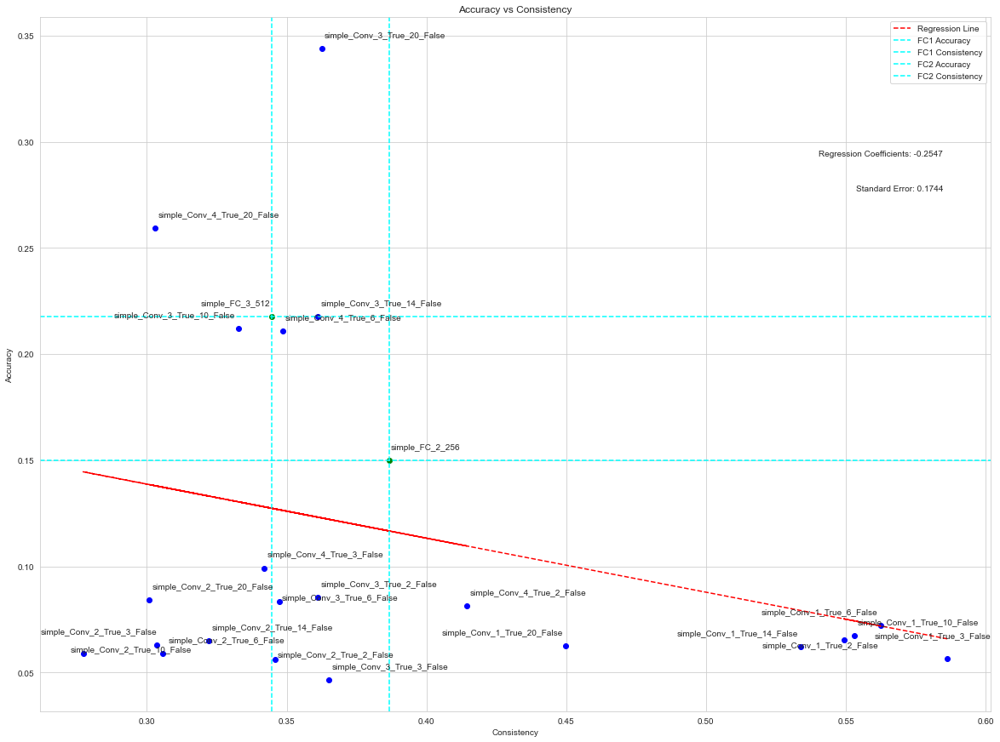

In [91]:
plot_acc_consi_fashion(get_acc_consi_epsi_fashion(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.1), conf_interval = False, mean_lines = False, fc_lines = True)

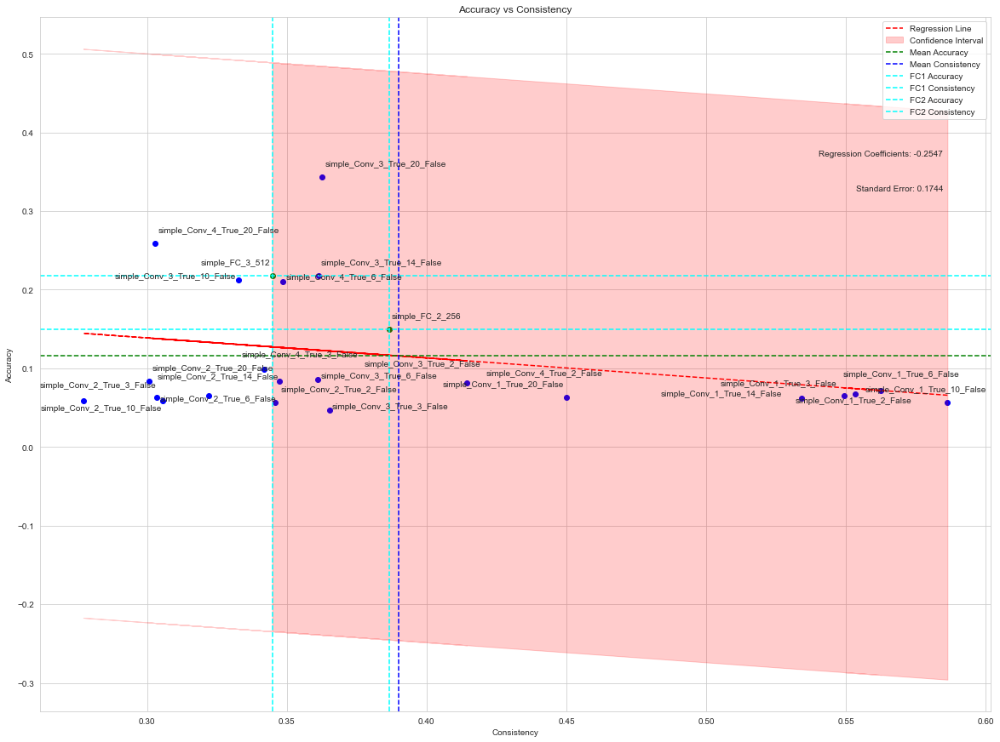

In [92]:
plot_acc_consi_fashion(get_acc_consi_epsi_fashion(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.1), conf_interval = True, mean_lines = True, fc_lines = True)

In [93]:
# uncomment or try other combinations
# plot_acc_consi_fashion(get_acc_consi_epsi_fashion(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.05), conf_interval = False, mean_lines = False, fc_lines = True)
#plot_acc_consi_fashion(get_acc_consi_epsi_fashion(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.15), conf_interval = False, mean_lines = False, fc_lines = True)
#plot_acc_consi_fashion(get_acc_consi_epsi_fashion(model_consistency_dict,accuracy_data, norm = np.inf, epsilon_ = 0.2), conf_interval = False, mean_lines = False, fc_lines = True)


### <h2 style="background-color:#B200FF;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre> Using Shift-Invariance-Adversarial-Robustness Graph</centre></strong></h2>

![GSIAR_](plots/GSIAR_.png)

The Shift-Invariance-Adversarial-Robustness graph was divided into four zones using the fully connected models as a reference point:
* **Top Left**: This zone typically encompasses the robust models, often including robust FC models. Models here exhibit high adversarial accuracy but low shift invariance.
* **Top Right**: This is the desired zone,or Goal zone, representing models that are both robust and shift invariant.
* **Bottom Left**: Models in this zone are neither robust nor shift invariant, making it an undesirable region, the dead zone.
* **Bottom Right**: This zone should be occupied by classic shift invariant CNN models, demonstrating high shift consistency but low adversarial accuracy.


The proposed process to identify robust models involves the following steps:

1. Training on a Smaller Dataset: Train various model configurations on a smaller dataset and plot their positions on the Graph Shift-Invariance-Adversarial-Robustness.
2. Identify Goal Zone Models: Select models that fall within or near the goal zone (top right) of the graph.
3. Full Training and Improvement: Fully train the selected models. Improve and fine-tune  these models using additional techniques.
4. Prioritize Based on Requirements: Depending on priorities (e.g., robustness, shift invariance), select models that align with the preferred characteristics. For example if our priority is to have the most robust model while keeping shift invariance. First we get a model from the Goal zone that has the best shift invariance, then we retrain the model using adversarial training.

In our case we will pick a model from the Goal zone, that has the best shift consistency, and we want to have the most robust model possible to the adversarial attack. For that we will use adversarial training on this model.

![GSIAR](plots/GSIAR.png)

In [94]:
gc.collect()

40350

In [95]:
def simple_FC(n_hidden):
    model = Sequential()
    model.add(Flatten(input_shape=(28, 28)))
    model.add(Dense(n_hidden, activation="relu"))
    model.add(Dense(10))
    return model

def simple_FC_2(n_hidden):
    model = Sequential()
    model.add(Flatten(input_shape=(28, 28)))
    model.add(Dense(n_hidden, activation="relu"))
    model.add(Dense(n_hidden, activation="relu"))
    model.add(Dense(10))
    return model

In [96]:
# Load the data from the saved files
with open('data/best_model/best_model_mnist_acc_array.pkl', 'rb') as file:
    acc_array = pickle.load(file)

with open('data/best_model/best_model_mnist_loss_array.pkl', 'rb') as file:
    loss_array = pickle.load(file)

with open('data/best_model/best_model_mnist_accuracy_data.pkl', 'rb') as file:
    accuracy_data = pickle.load(file)

with open('data/best_model/best_model_mnist_model_names.pkl', 'rb') as file:
    model_names = pickle.load(file)

with open('data/best_model/best_model_mnist_model_consistency_dict.pkl', 'rb') as file:
    model_consistency_dict = pickle.load(file)

with open('data/best_model/best_model_mnist_model_consistency_dict_2.pkl', 'rb') as file:
    model_consistency_dict_2 = pickle.load(file)

In [97]:
attack_params = [[np.inf, [0.05, 0.1,  0.15, 0.2,0.25]],[2, [0.5, 1,  1.5, 3]]]

norms = [attack_params[0][0], attack_params[1][0]]
epsilons = {
    attack_params[0][0]: attack_params[0][1],
    attack_params[1][0]: attack_params[1][1]
}

models = []
model_names_ = list(model_names.keys())
# [classifier, test_acc, train_acc, test_loss, train_loss]
for i, model_name in enumerate(model_names_):
    model_file = f'data/best_model/best_model_{model_name}.h5'
    model = tf.keras.models.load_model(model_file,  compile=False )
    accuracy_test= acc_array[i][0]
    accuracy_train= acc_array[i][1]
    loss_test = loss_array[i][0]
    loss_train = loss_array[i][0]
    models.append((model, accuracy_test,accuracy_train, loss_test,loss_train))

In [98]:
import plotly.graph_objects as go
import plotly.io as pio
fig_traces = []
for model_name, (_,_,_,test_loss,train_loss) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_loss)), y=train_loss, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_loss)), y=test_loss, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Loss'),
    title='Training and Validation Loss',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)

In [99]:
fig_traces = []
for model_name, (_, test_acc, train_acc,_,_) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_acc)), y=train_acc, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_acc)), y=test_acc, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Accuracy'),
    title='Training and Validation Accuracy',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)

In [100]:
import plotly.graph_objects as go
for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        # Set the line style based on the model name
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
        fig.add_trace(go.Scatter(x=eps, y=accs, mode='lines+markers', name=model_name, line=dict(dash=line_dash)))
    fig.update_layout(
        xaxis_title='Epsilon',
        yaxis_title='Accuracy',
        title=f'Accuracy on Attack Data (Norm={norm})',
        showlegend=True
    )
    fig.show()

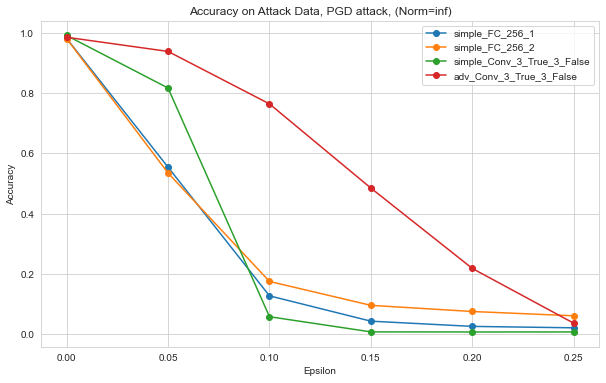

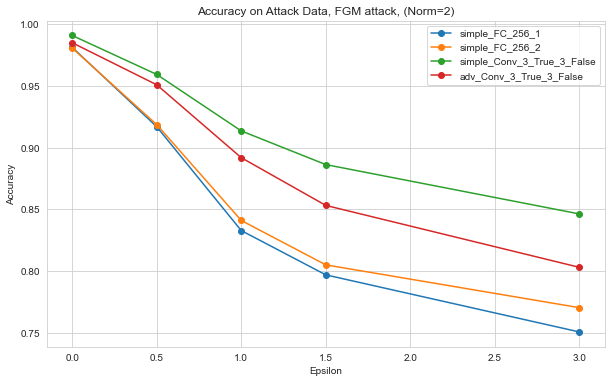

In [101]:
import matplotlib.pyplot as plt
for norm in norms:
    plt.figure(figsize=(10, 6))  # Increase the figure size for better spacing

    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        plt.plot(eps, accs, marker='o', label=model_name)

    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    if norm == 2 :
        plt.title(f"Accuracy on Attack Data, FGM attack, (Norm={norm})")
    else:
        plt.title(f"Accuracy on Attack Data, PGD attack, (Norm={norm})")

    # Place the legend outside the plot area to avoid overlapping
    plt.legend(loc='upper right') #, bbox_to_anchor=(1, 1), ncol=2)

    plt.show()

In [102]:
from tabulate import tabulate
table = []
for model_name, model_consistency in model_consistency_dict.items():
    table.append([model_name, "{:.2f}%".format(100. * model_consistency)])
headers = ["Model Name", "Consistency"]
print(tabulate(table, headers, tablefmt="grid"))

+----------------------------+---------------+
| Model Name                 | Consistency   |
+============================+===============+
| simple_FC_256_1            | 30.09%        |
+----------------------------+---------------+
| simple_FC_256_2            | 22.31%        |
+----------------------------+---------------+
| simple_Conv_3_True_3_False | 34.42%        |
+----------------------------+---------------+
| adv_Conv_3_True_3_False    | 27.42%        |
+----------------------------+---------------+


In [103]:
from functions.Extension_utils import get_acc_consi_epsi_best, plot_acc_consi_best

In [104]:
get_acc_consi_epsi_best(model_consistency_dict_2,accuracy_data, norm = np.inf, epsilon_ = 0.1)

[('simple_FC_256_1', 0.1275, 0.4565),
 ('simple_FC_256_2', 0.1753, 0.4392),
 ('simple_Conv_3_True_3_False', 0.0583, 0.7956),
 ('adv_Conv_3_True_3_False', 0.764, 0.6531)]

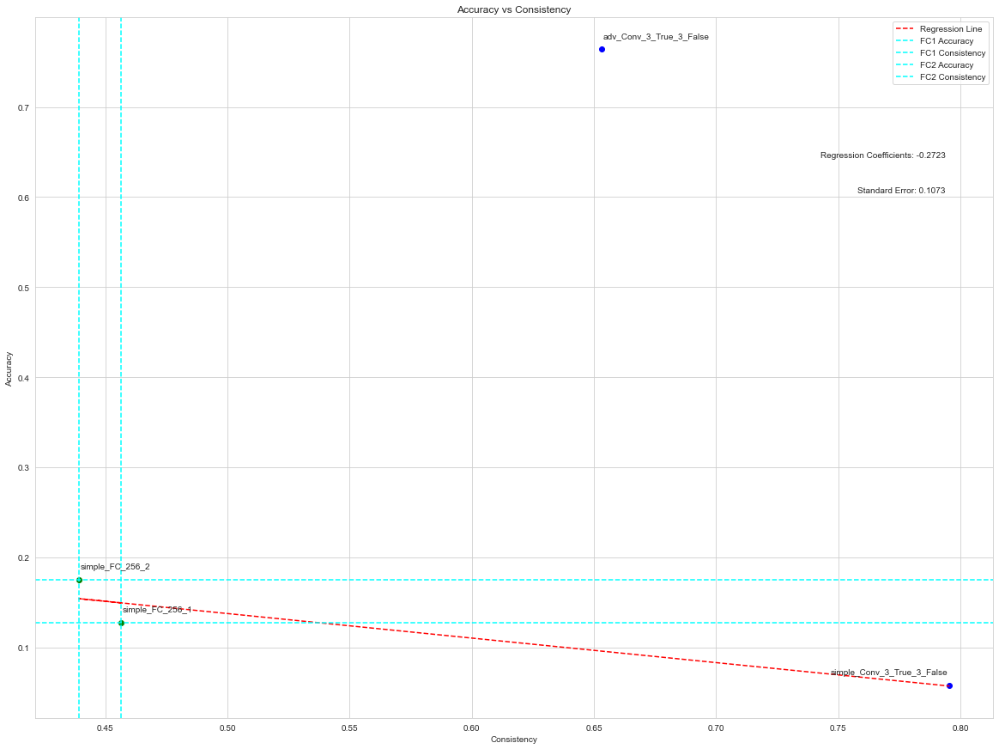

In [105]:
plot_acc_consi_best(get_acc_consi_epsi_best(model_consistency_dict_2,accuracy_data, norm = np.inf, epsilon_ = 0.1), conf_interval = False, mean_lines = False, fc_lines = True, reg= True)

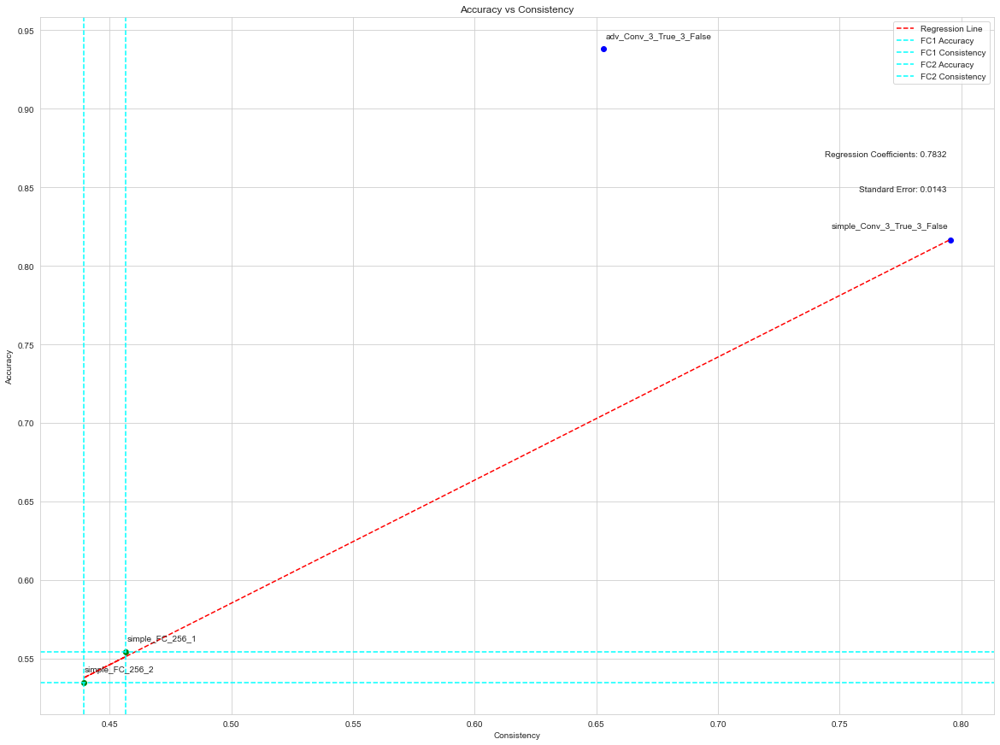

In [106]:
plot_acc_consi_best(get_acc_consi_epsi_best(model_consistency_dict_2,accuracy_data, norm = np.inf, epsilon_ = 0.05), conf_interval = False, mean_lines = False, fc_lines = True, reg= True)

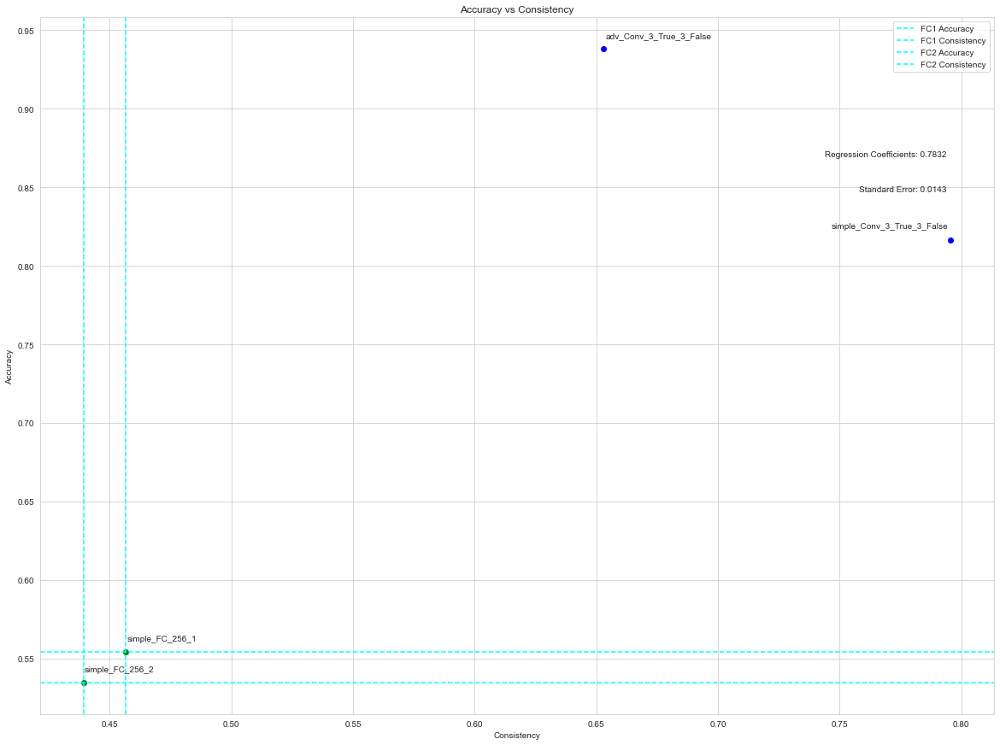

In [107]:
plot_acc_consi_best(get_acc_consi_epsi_best(model_consistency_dict_2,accuracy_data, norm = np.inf, epsilon_ = 0.05), conf_interval = False, mean_lines = False, fc_lines = True, reg= False)

In [117]:
# Uncomment for other combinations
#plot_acc_consi_best(get_acc_consi_epsi_best(model_consistency_dict_2,accuracy_data, norm = np.inf, epsilon_ = 0.05), conf_interval = False, mean_lines = False, fc_lines = False, reg= False)
#plot_acc_consi_best(get_acc_consi_epsi_best(model_consistency_dict_2, accuracy_data, norm=np.inf, epsilon_=0.1), conf_interval=False, mean_lines=True, fc_lines=True, reg=True, annote=True, limit = True)
#plot_acc_consi_best(get_acc_consi_epsi_best(model_consistency_dict_2, accuracy_data, norm=np.inf, epsilon_=0.05), conf_interval=False, mean_lines=True, fc_lines=True, reg=True, annote=True, limit = True)

In [ ]:
# get the new requirements file
#!pipreqs . --ignore ".env"

#### Use of neural structured learning

This is not included in the practical but we might explore it later as an other technique to improve the model.

In [ ]:
!pip install --upgrade neural_structured_learning

In [130]:
import neural_structured_learning as nsl

In [145]:
adv_config = nsl.configs.make_adv_reg_config(multiplier=0.2, adv_step_size=0.05)
adv_model = nsl.keras.AdversarialRegularization(model, adv_config)

In [ ]:
adv_model.compile(optimizer='adam', loss='sparse_categorizal_crossentropy', metrics=['accuracy'])
adv_model.fit({'feature': x_train, 'label': y_train}, epochs=5)
adv_model.evaluate({'feature': x_test, 'label': y_test})